## Importing packages and data

In [1]:
import glob
import numpy as np
import pandas as pd
from scipy.stats import pearsonr, chi2_contingency
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from mpl_toolkits.axes_grid1 import make_axes_locatable
from multiprocessing import Pool
import seaborn as sns
from colav.extract_data import *
from biopandas.pdb import PandasPdb
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP

/Users/asaeed/miniforge3/envs/comp/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/asaeed/miniforge3/envs/comp/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/asaeed/miniforge3/envs/comp/lib/python3.9/site-packages/umap/dist

In [2]:
# sns.set_palette(sns.color_palette("Dark2"))

In [3]:
plt.rcParams["font.size"] = 14
plt.rcParams["axes.labelsize"] = 16
plt.rcParams["axes.labelweight"] = "regular"
plt.rcParams["axes.titlesize"] = 16
plt.rcParams["axes.titleweight"] = "regular"
resnum_bounds = (7, 279)

In [4]:
theseus_strucs = sorted(glob.glob("ptp1b_data/ptp1b_theseus_data/*pdb"))

In [5]:
# untreated dihedral data processing
untreated_dihedrals, dihedral_strucs = generate_dihedral_matrix(
    theseus_strucs,
    resnum_bounds,
    save=True,
    save_prefix="ptp1b_data/ptp1b",
    verbose=True,
)
# untreated_dihedrals, dihedral_strucs = load_dihedral_matrix('ptp1b_data/ptp1b_dh_dict.pkl')
untreated_dihedrals_data = np.hstack(
    [np.sin(untreated_dihedrals), np.cos(untreated_dihedrals)]
)

Calculating the dihedral angles...
Attempting to calculate for ptp1b_data/ptp1b_theseus_data/theseus_1a5y_chainA.pdb
Skipping ptp1b_data/ptp1b_theseus_data/theseus_1a5y_chainA.pdb; insufficient atoms!
Attempting to calculate for ptp1b_data/ptp1b_theseus_data/theseus_1aax_chainA.pdb
Attempting to calculate for ptp1b_data/ptp1b_theseus_data/theseus_1bzc_chainA.pdb
Attempting to calculate for ptp1b_data/ptp1b_theseus_data/theseus_1bzh_chainA.pdb
Attempting to calculate for ptp1b_data/ptp1b_theseus_data/theseus_1bzj_chainA.pdb
Attempting to calculate for ptp1b_data/ptp1b_theseus_data/theseus_1c83_chainA.pdb
Attempting to calculate for ptp1b_data/ptp1b_theseus_data/theseus_1c84_chainA.pdb
Attempting to calculate for ptp1b_data/ptp1b_theseus_data/theseus_1c85_chainA.pdb
Attempting to calculate for ptp1b_data/ptp1b_theseus_data/theseus_1c86_chainA.pdb
Attempting to calculate for ptp1b_data/ptp1b_theseus_data/theseus_1c87_chainA.pdb
Attempting to calculate for ptp1b_data/ptp1b_theseus_data/the

In [6]:
# rope dihedral data processing
rope_dihedrals = pd.read_csv("ptp1b_data/filtered-ptp1b.csv")
rope_strucs = np.array([x[:-2] for x in rope_dihedrals.Name.values])
rope_dihedrals.drop(["Unnamed: 0", "Name"], axis=1, inplace=True)
rope_dihedrals = np.deg2rad(rope_dihedrals.values)
rope_dihedrals_data = np.hstack([np.sin(rope_dihedrals), np.cos(rope_dihedrals)])

In [7]:
# Dihedral PCA
# untreated
u_pca = PCA(n_components=10)
u_A = u_pca.fit_transform(untreated_dihedrals_data)

# rope
rope_pca = PCA(n_components=10)
rope_A = rope_pca.fit_transform(rope_dihedrals_data)

In [8]:
u_pca.explained_variance_ratio_, rope_pca.explained_variance_ratio_

(array([0.29747788, 0.06309758, 0.037037  , 0.03535305, 0.0287802 ,
        0.02453796, 0.02153294, 0.01868356, 0.01458321, 0.01343809]),
 array([0.26460967, 0.05141095, 0.03610283, 0.03250671, 0.02652774,
        0.0217012 , 0.02028537, 0.01891694, 0.01596703, 0.01525418]))

In [9]:
# pairwise distances data processing
# pw_data, pw_strucs = generate_pw_matrix(theseus_strucs,
#                                         resnum_bounds,
#                                         save=True,
#                                         save_prefix='ptp1b_data/ptp1b',
#                                         verbose=False)
pw_data, pw_strucs = load_pw_matrix("ptp1b_data/ptp1b_pw_dict.pkl")

In [10]:
# Pairwise Distance PCA
pw_pca = PCA(n_components=10)
pw_A = pw_pca.fit_transform(pw_data)

In [11]:
pw_pca.explained_variance_ratio_

array([0.59867585, 0.0718247 , 0.06767347, 0.04182721, 0.03015834,
       0.0148717 , 0.01308885, 0.01175772, 0.00932679, 0.00816632])

In [12]:
# strain data processing
# sa_data, sa_strucs = generate_strain_matrix(
#     theseus_strucs,
#     "ptp1b_data/ptp1b_theseus_data/theseus_1nwl_chainA.pdb",
#     "sheart",
#     resnum_bounds,
#     save=True,
#     save_prefix="ptp1b_data/ptp1b_1nwl",
#     verbose=False,
# )
sa_data, sa_strucs = load_strain_matrix("ptp1b_data/ptp1b_1nwl_sa_sheart_dict.pkl")

In [13]:
# from colav.strain_analysis import determine_shared_atoms 
# atom_set = determine_shared_atoms(
#     theseus_strucs, 
#     PandasPdb().read_pdb("ptp1b_data/ptp1b_theseus_data/theseus_1nwl_chainA.pdb").df['ATOM'],
#     resnum_bounds, 
#     save=True, 
#     save_prefix='ptp1b_data/ptp1b'
# )

In [14]:
# Strain Analysis PCA
sa_pca = PCA(n_components=10)
sa_A = sa_pca.fit_transform(sa_data)

In [15]:
sa_pca.explained_variance_ratio_

array([0.58555996, 0.08409118, 0.0470309 , 0.03535379, 0.02284818,
       0.0167237 , 0.01463643, 0.0122772 , 0.01073388, 0.00857248])

In [16]:
conformation_dict = pickle.load(open("ptp1b_data/ptp1b_conformation_dict.pkl", "rb"))

In [17]:
space_group_dict = pickle.load(open("ptp1b_data/ptp1b_sg_dict.pkl", "rb"))

In [18]:
# truncated to fit w/ resnum_bounds
ptp1b_ss_dict = {
    u"\u03b11'": (7,13), 
    u"\u03b12'": (15,25),
    u'\u03b11': (37,44), 
    u'\u03b21': (56,59), 
    u'\u03b22': (69,74), 
    u'\u03b23': (78,84), 
    u'\u03b12': (91,102),
    u'\u03b24': (106,109), 
    u'\u03b25': (114,115), 
    u'\u03b26': (118,119), 
    u'\u03b27': (133,135), 
    u'\u03b28': (140,149),
    u'\u03b29': (153,162), 
    u'\u03b210': (167,176), 
    u'\u03b13': (187,201), 
    u'\u03b211': (211,214), 
    u'\u03b14': (220,239), 
    u'\u03b15': (245,254), 
    u'\u03b16': (263,279), 
}

## Main text figures

### PCA of COLAV representations

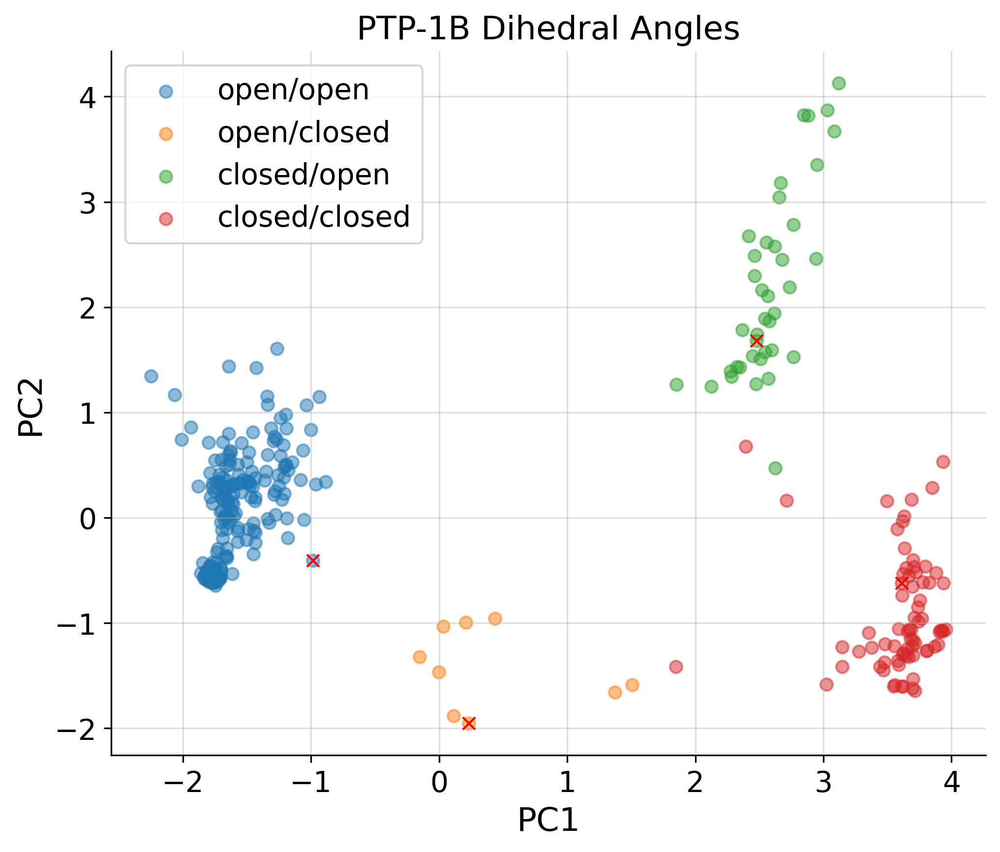

In [19]:
# PC space plots
fig, ax = plt.subplots(1, 1, figsize=(7,6), dpi=300)
# ax = ax.flatten()
pca_list = [u_A, pw_A, sa_A]
struc_list_list = [dihedral_strucs, pw_strucs, sa_strucs]
title_list = ["Dihedral Angles", "C\u03b1 Pairwise Distances", "Strain Analysis"]

# enumerate the axes and the list of the PCAs
i = 0
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.grid(alpha=0.4)

# determine conformation color
conformations = list()
for k in struc_list_list[i]:
    if k.startswith("ptp1b_data/"):
        conformations.append(conformation_dict[k.split("/")[-1][8:-4]])
    else:
        conformations.append(conformation_dict[k])

conformations = np.array(conformations)

cluster1 = ax.scatter(
    pca_list[i][conformations == "open_open", 0],
    pca_list[i][conformations == "open_open", 1],
    marker="o",
    alpha=0.5,
    edgecolor=None,
    linewidth=1,
    label="open/open",
)
cluster2 = ax.scatter(
    pca_list[i][conformations == "open_closed", 0],
    pca_list[i][conformations == "open_closed", 1],
    marker="o",
    alpha=0.5,
    edgecolor=None,
    linewidth=1,
    label="open/closed",
)
cluster3 = ax.scatter(
    pca_list[i][conformations == "closed_open", 0],
    pca_list[i][conformations == "closed_open", 1],
    marker="o",
    alpha=0.5,
    edgecolor=None,
    linewidth=1,
    label="closed/open",
)
cluster4 = ax.scatter(
    pca_list[i][conformations == "closed_closed", 0],
    pca_list[i][conformations == "closed_closed", 1],
    marker="o",
    alpha=0.5,
    edgecolor=None,
    linewidth=1,
    label="closed/closed",
)

for j,struc in enumerate(dihedral_strucs): 
    if '1nwl' in struc or '4qbw' in struc or '1pxh' in struc or '1sug' in struc: 
        plt.plot(u_A[j,0], u_A[j,1], 'rx')

ax.set_ylabel("PC2")
ax.set_xlabel("PC1")
ax.set_title(f"PTP-1B {title_list[i]}")
ax.legend(
loc="upper left",
handles=[cluster1, cluster2, cluster3, cluster4],
labels=["open/open", "open/closed", "closed/open", "closed/closed"],
)
plt.tight_layout()
plt.show()

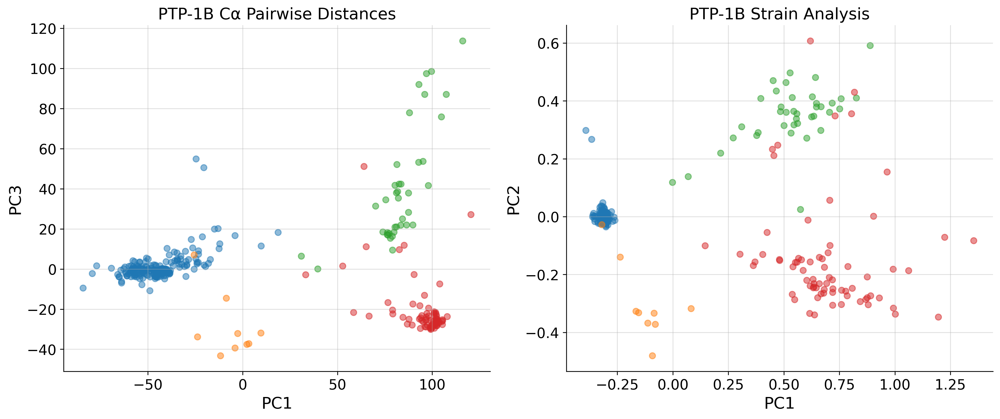

In [20]:
# PC space plots
fig, ax = plt.subplots(1, 2, figsize=(14, 6), dpi=300)
ax = ax.flatten()
pca_list = [pw_A, sa_A]
struc_list_list = [pw_strucs, sa_strucs]
title_list = ["C\u03b1 Pairwise Distances", "Strain Analysis"]

# enumerate the axes and the list of the PCAs
for i in np.arange(len(pca_list)):
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['right'].set_visible(False)
    ax[i].grid(alpha=0.4)
    
    # determine conformation color
    conformations = list()
    for k in struc_list_list[i]:
        if k.startswith("ptp1b_data/"):
            conformations.append(conformation_dict[k.split("/")[-1][8:-4]])
        else:
            conformations.append(conformation_dict[k])

    conformations = np.array(conformations)
    if i == 0:
        cluster1 = ax[i].scatter(
            pca_list[i][conformations == "open_open", 0],
            pca_list[i][conformations == "open_open", 2],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            linewidth=1,
            label="open/open",
        )
        cluster2 = ax[i].scatter(
            pca_list[i][conformations == "open_closed", 0],
            pca_list[i][conformations == "open_closed", 2],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            linewidth=1,
            label="open/closed",
        )
        cluster3 = ax[i].scatter(
            pca_list[i][conformations == "closed_open", 0],
            pca_list[i][conformations == "closed_open", 2],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            linewidth=1,
            label="closed/open",
        )
        cluster4 = ax[i].scatter(
            pca_list[i][conformations == "closed_closed", 0],
            pca_list[i][conformations == "closed_closed", 2],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            linewidth=1,
            label="closed/closed",
        )
        ax[i].set_ylabel("PC3")
        ax[i].set_xlabel("PC1")
        ax[i].set_title(f"PTP-1B {title_list[i]}")
    else:
        cluster1 = ax[i].scatter(
            pca_list[i][conformations == "open_open", 0],
            pca_list[i][conformations == "open_open", 1],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            linewidth=1,
            label="open/open",
        )
        cluster2 = ax[i].scatter(
            pca_list[i][conformations == "open_closed", 0],
            pca_list[i][conformations == "open_closed", 1],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            linewidth=1,
            label="open/closed",
        )
        cluster3 = ax[i].scatter(
            pca_list[i][conformations == "closed_open", 0],
            pca_list[i][conformations == "closed_open", 1],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            linewidth=1,
            label="closed/open",
        )
        cluster4 = ax[i].scatter(
            pca_list[i][conformations == "closed_closed", 0],
            pca_list[i][conformations == "closed_closed", 1],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            linewidth=1,
            label="closed/closed",
        )
        ax[i].set_ylabel("PC2")
        ax[i].set_xlabel("PC1")
        ax[i].set_title(f"PTP-1B {title_list[i]}")
# ax[0].legend(
#     loc="upper left",
#     handles=[cluster1, cluster2, cluster3, cluster4],
#     labels=["open/open", "open/closed", "closed/open", "closed/closed"],
# )
plt.tight_layout()
plt.show()

In [21]:
# create array for storing correlation coefficients
dh_pw_matrix = list()
dh_sa_matrix = list()
pw_sa_matrix = list()
psi_idx = np.arange(0, untreated_dihedrals_data.shape[1] // 2, 3)
omg_idx = np.arange(1, untreated_dihedrals_data.shape[1] // 2, 3)
phi_idx = np.arange(2, untreated_dihedrals_data.shape[1] // 2, 3)
# load the shared atom data
shared_atom_set = pickle.load(open("ptp1b_data/ptp1b_atom_set.pkl", "rb"))

for i in np.arange(10):
    for j in np.arange(10):
        # calculate the correlation coefficients
        dh_pw_matrix.append(
            pearsonr(
                calculate_dh_rc(u_pca.components_[i, :])[psi_idx]
                + calculate_dh_rc(u_pca.components_[i, :])[phi_idx]
                + calculate_dh_rc(u_pca.components_[i, :])[omg_idx],
                calculate_pw_rc(pw_pca.components_[j, :], resnum_bounds)[1:],
            )[0]
        )
        dh_sa_matrix.append(
            pearsonr(
                calculate_dh_rc(u_pca.components_[i, :])[psi_idx]
                + calculate_dh_rc(u_pca.components_[i, :])[phi_idx]
                + calculate_dh_rc(u_pca.components_[i, :])[omg_idx],
                calculate_sa_rc(sa_pca.components_[j, :], sorted(shared_atom_set))[1:],
            )[0]
        )
        pw_sa_matrix.append(
            pearsonr(
                calculate_pw_rc(pw_pca.components_[i, :], resnum_bounds),
                calculate_sa_rc(sa_pca.components_[j, :], sorted(shared_atom_set)),
            )[0]
        )

dh_pw_matrix = np.array(dh_pw_matrix).reshape(10, 10)
dh_sa_matrix = np.array(dh_sa_matrix).reshape(10, 10)
pw_sa_matrix = np.array(pw_sa_matrix).reshape(10, 10)

In [22]:
u_pca.explained_variance_ratio_

array([0.29747788, 0.06309758, 0.037037  , 0.03535305, 0.0287802 ,
       0.02453796, 0.02153294, 0.01868356, 0.01458321, 0.01343809])

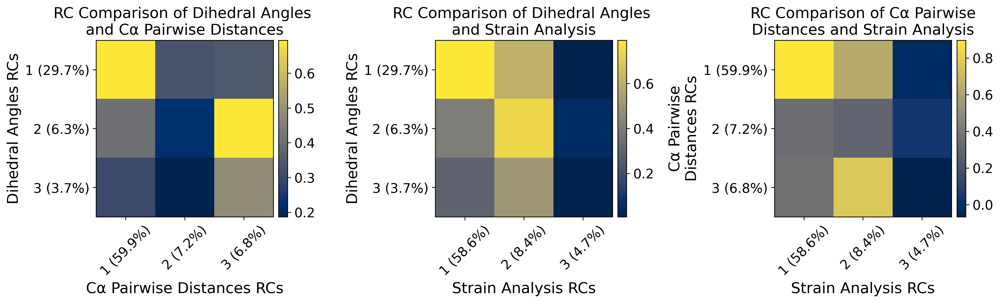

In [23]:
fig, ax = plt.subplots(1, 3, figsize=(15, 6), dpi=300)
ax = ax.flatten()
axs_list = [("Dihedral Angles", "C\u03b1 Pairwise Distances"), ("Dihedral Angles", "Strain Analysis"), ("C\u03b1 Pairwise\nDistances", "Strain Analysis")]
dot_matrix_list = [dh_pw_matrix, dh_sa_matrix, pw_sa_matrix]
for i in np.arange(3):
    im = ax[i].imshow(dot_matrix_list[i][:3,:3], cmap="cividis", interpolation=None)
    ax[i].set_xlabel(f"{axs_list[i][1]} RCs")
    ax[i].set_ylabel(f"{axs_list[i][0]} RCs")
    ax[i].set_title(f"RC Comparison of {axs_list[i][0]} \nand {axs_list[i][1]}" if axs_list[i][0] == "Dihedral Angles" else f"RC Comparison of {axs_list[i][0]} and {axs_list[i][1]}")
    ax[i].set_xticks(list(np.arange(3)))
    ax[i].set_yticks(list(np.arange(3)))
    ax[i].set_xticklabels([f'{k} ({np.round(pw_pca.explained_variance_ratio_[k-1]*100,1)}%)' if i == 0 else f'{k} ({np.round(sa_pca.explained_variance_ratio_[k-1]*100,1)}%)'for k in np.arange(1,4)], rotation=45)
    ax[i].set_yticklabels([f'{k} ({np.round(u_pca.explained_variance_ratio_[k-1]*100,1)}%)' if i <= 1 else f'{k} ({np.round(pw_pca.explained_variance_ratio_[k-1]*100,1)}%)'for k in np.arange(1,4)])
    divider = make_axes_locatable(ax[i])
    cax = divider.append_axes("right", "5%", pad="3%")
    plt.colorbar(im, cax=cax)
plt.tight_layout()
plt.show()

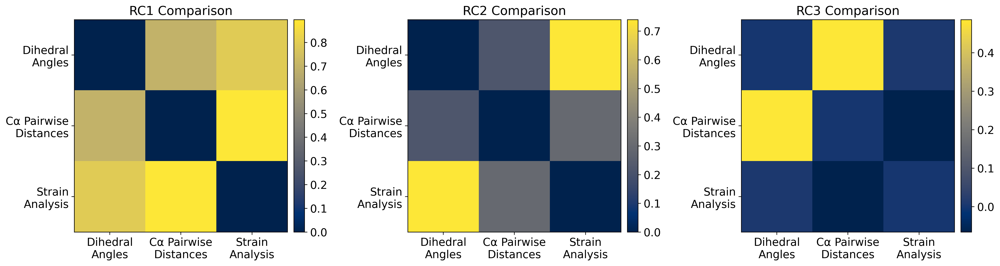

In [24]:
fig, ax = plt.subplots(1, 3, figsize=(18, 6), dpi=300)
ax = ax.flatten()
for i in np.arange(3):
    dh_tl = calculate_dh_rc(u_pca.components_[i, :])[psi_idx] + calculate_dh_rc(u_pca.components_[i, :])[phi_idx] + calculate_dh_rc(u_pca.components_[i, :])[omg_idx]
    pw_tl = calculate_pw_rc(pw_pca.components_[i, :], resnum_bounds)[1:]
    sa_tl = calculate_sa_rc(sa_pca.components_[i, :], sorted(shared_atom_set))[1:]
    im = ax[i].imshow(np.array([
#         [pearsonr(dh_tl, dh_tl)[0], pearsonr(dh_tl, pw_tl)[0], pearsonr(dh_tl, sa_tl)[0]],
#         [pearsonr(pw_tl, dh_tl)[0], pearsonr(pw_tl, pw_tl)[0], pearsonr(pw_tl, sa_tl)[0]],
#         [pearsonr(sa_tl, dh_tl)[0], pearsonr(sa_tl, pw_tl)[0], pearsonr(sa_tl, sa_tl)[0]],
        [0, pearsonr(dh_tl, pw_tl)[0], pearsonr(dh_tl, sa_tl)[0]],
        [pearsonr(pw_tl, dh_tl)[0], 0, pearsonr(pw_tl, sa_tl)[0]],
        [pearsonr(sa_tl, dh_tl)[0], pearsonr(sa_tl, pw_tl)[0], 0],
    ]), cmap="cividis", interpolation=None)
#     ax[i].set_xlabel(f"Representation")
#     ax[i].set_ylabel(f"Representation")
    ax[i].set_title(f"RC{i+1} Comparison")
    ax[i].set_xticks(list(np.arange(3)))
    ax[i].set_xticklabels(['Dihedral\nAngles', u'C\u03b1 Pairwise\nDistances', 'Strain\nAnalysis'])
    ax[i].set_yticks(list(np.arange(3)))
    ax[i].set_yticklabels(['Dihedral\nAngles', u'C\u03b1 Pairwise\nDistances', 'Strain\nAnalysis'])
    divider = make_axes_locatable(ax[i])
    cax = divider.append_axes("right", "5%", pad="3%")
    plt.colorbar(im, cax=cax)
plt.tight_layout()
plt.show()

### Dihedral Angle PCA space (PC1 & PC2) with RC1 & RC2

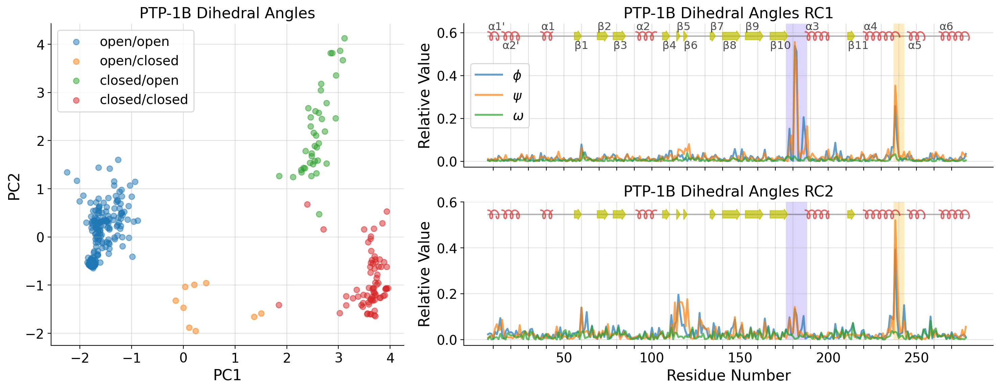

In [25]:
gs_kw = dict(width_ratios=[1, 1.5], height_ratios=[1, 1])
fig, axd = plt.subplot_mosaic(
    [["left", "upper right"], ["left", "lower right"]],
    gridspec_kw=gs_kw,
    figsize=(15, 6),
    layout="constrained",
    dpi=200,
)
for i, ax in enumerate(axd):
    axd[ax].spines['top'].set_visible(False)
    axd[ax].spines['right'].set_visible(False)
    axd[ax].grid(alpha=0.4)
    if i == 0:
        # determine conformation color
        conformations = list()
        for k in dihedral_strucs:
            if k.startswith("ptp1b_data/"):
                conformations.append(conformation_dict[k.split("/")[-1][8:-4]])
            else:
                conformations.append(conformation_dict[k])

        conformations = np.array(conformations)
        axd[ax].scatter(
            u_A[conformations == "open_open", 0],
            u_A[conformations == "open_open", 1],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            linewidth=1,
            label="open/open",
        )
        axd[ax].scatter(
            u_A[conformations == "open_closed", 0],
            u_A[conformations == "open_closed", 1],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            linewidth=1,
            label="open/closed",
        )
        axd[ax].scatter(
            u_A[conformations == "closed_open", 0],
            u_A[conformations == "closed_open", 1],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            linewidth=1,
            label="closed/open",
        )
        axd[ax].scatter(
            u_A[conformations == "closed_closed", 0],
            u_A[conformations == "closed_closed", 1],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            linewidth=1,
            label="closed/closed",
        )
#         axd[ax].scatter(
#             u_A[[33, 45, 59, 125], 0],
#             u_A[[33, 45, 59, 125], 1],
#             marker="x",
#             s=100,
#             c="k",
#             label="examples",
#         )
        axd[ax].set_ylabel("PC2")
        axd[ax].set_xlabel("PC1")
        axd[ax].set_title("PTP-1B Dihedral Angles")
        axd[ax].legend(loc="upper left")

    else:
        psi_idx = np.arange(0, untreated_dihedrals_data.shape[1] // 2, 3)
        omg_idx = np.arange(1, untreated_dihedrals_data.shape[1] // 2, 3)
        phi_idx = np.arange(2, untreated_dihedrals_data.shape[1] // 2, 3)
        dh_range = np.arange(resnum_bounds[0], resnum_bounds[1])
        (phi_trace,) = axd[ax].plot(
            dh_range,
            calculate_dh_rc(u_pca.components_[i - 1])[phi_idx],
            "-",
            label=r"$\phi$",
            linewidth=2,
            alpha=0.7,
        )
        (psi_trace,) = axd[ax].plot(
            dh_range,
            calculate_dh_rc(u_pca.components_[i - 1])[psi_idx],
            "-",
            label=r"$\psi$",
            linewidth=2,
            alpha=0.7,
        )
        (omg_trace,) = axd[ax].plot(
            dh_range,
            calculate_dh_rc(u_pca.components_[i - 1])[omg_idx],
            "-",
            label=r"$\omega$",
            linewidth=2,
            alpha=0.7,
        )
        ylims = axd[ax].get_ylim()
        axd[ax].set_title(f"PTP-1B Dihedral Angles RC{i}")
        axd[ax].set_xticks(
            [dh for dh in dh_range if dh % 10 == 0],
            labels=[dh if dh % 50 == 0 else '' for dh in dh_range if dh % 10 == 0],
        )
        #         axd[ax].set_yticks(np.arange(0, axd[ax].get_yticks().max(), 0.1), labels=np.round(np.arange(0, axd[ax].get_yticks().max(), 0.1), 2))

        axd[ax].add_patch(
            Rectangle(
                (176, 0),
                width=12,
                height=3.5,  # WPD loop
                facecolor="#785EF0",
                alpha=0.25,
                fill=True,
            )
        )
        axd[ax].add_patch(
            Rectangle(
                (237, 0),
                width=6,
                height=3.5,  # L16 loop
                facecolor="#FFB000",
                alpha=0.25,
                fill=True,
            )
        )
        axd[ax].plot(np.arange(7,280), [ylims[1]]*273, alpha=0.3, color='k', linestyle='-', zorder=1)
        axd[ax].set_ylim((ylims[0], ylims[1]*1.1))
        counter = 0
        for k,v in ptp1b_ss_dict.items(): 
            if k.startswith(u'\u03b1'): 
                ts = np.linspace(v[0], v[1], num=1000)
                axd[ax].plot(ts + 1.5*np.sin((ts-v[0])*2*np.pi/3.6), (ylims[1]/30)*np.cos((ts-v[0])*2*np.pi/3.6)+ylims[1], color='tab:red', alpha=0.7, zorder=2)
                if ax == 'upper right': 
                    axd[ax].text(v[0], ylims[1]+(1.5*ylims[1]/30) if counter%2 == 0 else ylims[1]-(3*ylims[1]/30), k, fontsize='small', alpha=0.7)
                    counter += 1
            else: 
                axd[ax].arrow(v[0],ylims[1],v[1]-v[0]+1,0, width=(ylims[1]/17), head_width=(ylims[1]/12), head_length=2, ec='y', fc='y', length_includes_head=True, alpha=0.7, zorder=3)
                if ax == 'upper right': 
                    axd[ax].text(v[0], ylims[1]+(1.5*ylims[1]/30) if counter%2 == 0 else ylims[1]-(3*ylims[1]/30), k, fontsize='small', alpha=0.7)
                    counter += 1
        axd[ax].set_ylabel("Relative Value")
axd["upper right"].set_xticklabels([])
axd["upper right"].legend(loc="center left")
axd["lower right"].set_xlabel("Residue Number")
plt.tight_layout()
plt.show()

In [26]:
l16_loop_dihedrals = untreated_dihedrals[:,687:714]
l16_loop_dihedrals_data = np.hstack([np.sin(l16_loop_dihedrals), np.cos(l16_loop_dihedrals)])
l16_loop_pca = PCA(n_components=10)
l16_loop_A = l16_loop_pca.fit_transform(l16_loop_dihedrals_data)
l16_loop_pca.explained_variance_ratio_

array([0.63530741, 0.07368558, 0.06210699, 0.03719484, 0.03084564,
       0.02494609, 0.01972787, 0.0180215 , 0.01457365, 0.0123182 ])

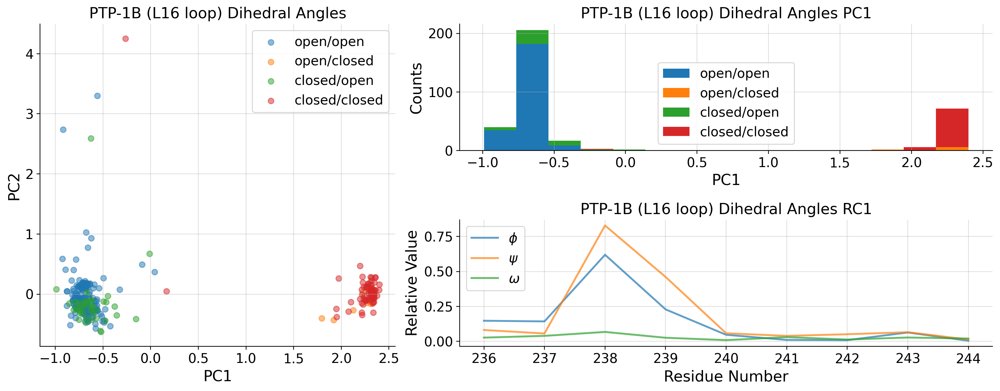

In [63]:
gs_kw = dict(width_ratios=[1, 1.5], height_ratios=[1, 1])
fig, axd = plt.subplot_mosaic(
    [["left", "upper right"], ["left", "lower right"]],
    gridspec_kw=gs_kw,
    figsize=(15, 6),
    layout="constrained",
    dpi=200,
)
tl_list = [-1, 0, 1]
for i, ax in enumerate(axd):
    axd[ax].spines['top'].set_visible(False)
    axd[ax].spines['right'].set_visible(False)
    axd[ax].grid(alpha=0.4)
    if i == 0:
        # determine conformation color
        conformations = list()
        for k in dihedral_strucs:
            if k.startswith("ptp1b_data/"):
                conformations.append(conformation_dict[k.split("/")[-1][8:-4]])
            else:
                conformations.append(conformation_dict[k])

        conformations = np.array(conformations)
        axd[ax].scatter(
            l16_loop_A[conformations == "open_open", 0],
            l16_loop_A[conformations == "open_open", 1],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            linewidth=1,
            label="open/open",
        )
        axd[ax].scatter(
            l16_loop_A[conformations == "open_closed", 0],
            l16_loop_A[conformations == "open_closed", 1],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            linewidth=1,
            label="open/closed",
        )
        axd[ax].scatter(
            l16_loop_A[conformations == "closed_open", 0],
            l16_loop_A[conformations == "closed_open", 1],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            linewidth=1,
            label="closed/open",
        )
        axd[ax].scatter(
            l16_loop_A[conformations == "closed_closed", 0],
            l16_loop_A[conformations == "closed_closed", 1],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            linewidth=1,
            label="closed/closed",
        )
#         for j in np.arange(l16_loop_A.shape[0]): 
#             if l16_loop_A[j,1] > 0 and l16_loop_A[j,0] > -0.5: 
#                 axd[ax].annotate(dihedral_strucs[j].split('/')[-1][8:-4], (l16_loop_A[j,0], l16_loop_A[j,1]))
        axd[ax].set_ylabel("PC2")
        axd[ax].set_xlabel("PC1")
        axd[ax].set_title("PTP-1B (L16 loop) Dihedral Angles")
    elif i == 1: 
        axd[ax].hist(np.array([l16_loop_A[conformations=='open_open',0], 
                  l16_loop_A[conformations=='open_closed',0], 
                  l16_loop_A[conformations=='closed_open',0], 
                  l16_loop_A[conformations=='closed_closed',0]], dtype='object'), 
        bins=15, density=False, histtype='bar', stacked=True, label=['open/open', 'open/closed', 'closed/open', 'closed/closed'])
        axd[ax].set_title('PTP-1B (L16 loop) Dihedral Angles PC1')
        axd[ax].set_xlabel('PC1')
        axd[ax].set_ylabel('Counts')
    else:
        psi_idx = np.arange(0, l16_loop_dihedrals_data.shape[1] // 2, 3)
        omg_idx = np.arange(1, l16_loop_dihedrals_data.shape[1] // 2, 3)
        phi_idx = np.arange(2, l16_loop_dihedrals_data.shape[1] // 2, 3)
        dh_range = np.arange(236, 244+1)
        (phi_trace,) = axd[ax].plot(
            dh_range,
            calculate_dh_rc(l16_loop_pca.components_[tl_list[1]])[phi_idx],
            "-",
            label=r"$\phi$",
            linewidth=2,
            alpha=0.7,
        )
        (psi_trace,) = axd[ax].plot(
            dh_range,
            calculate_dh_rc(l16_loop_pca.components_[tl_list[1]])[psi_idx],
            "-",
            label=r"$\psi$",
            linewidth=2,
            alpha=0.7,
        )
        (omg_trace,) = axd[ax].plot(
            dh_range,
            calculate_dh_rc(l16_loop_pca.components_[tl_list[1]])[omg_idx],
            "-",
            label=r"$\omega$",
            linewidth=2,
            alpha=0.7,
        )
        ylims = axd[ax].get_ylim()
        axd[ax].set_title(
            f"PTP-1B (L16 loop) Dihedral Angles RC{tl_list[1]+1}"
        )
        axd[ax].set_xticks(
            [dh for dh in dh_range], 
            labels=[dh for dh in dh_range],
        )
        axd[ax].set_ylabel("Relative Value")
        axd[ax].set_xlabel("Residue Number")
axd["left"].legend(loc="best")
axd["upper right"].legend(loc="best")
axd["lower right"].legend(loc="upper left")
plt.tight_layout()
plt.show()

### Contingency table and chi-squared test
The null hypothesis of this hypothesis test is that the three regions of PTP-1B -- WPD loop, L16 loop, and \alpha7 helix -- are 

In [28]:
a7_helix = list()
for i,k in enumerate(dihedral_strucs): 
    a7_helix.append(PandasPdb().read_pdb(k).df['ATOM'].residue_number.values[-1])
a7_helix = (np.array(a7_helix) >= 290).astype("int")

In [29]:
closed_wpd = np.zeros(len(dihedral_strucs)).astype("int")
closed_l16 = np.zeros(len(dihedral_strucs)).astype("int")
for i,conf in enumerate(conformations): 
    if conf.startswith("closed"): 
        closed_wpd[i] += 1
    if conf.endswith("closed"): 
        closed_l16[i] += 1

In [30]:
ctable = np.array([[[np.sum(1*(conformations == "open_open") * (1-a7_helix)), np.sum(1*(conformations == "open_closed") * (1-a7_helix))], 
           [np.sum(1*(conformations == "closed_open") * (1-a7_helix)), np.sum(1*(conformations == "closed_closed") * (1-a7_helix))]], 
          [[np.sum(1*(conformations == "open_open") * (a7_helix)), np.sum(1*(conformations == "open_closed") * (a7_helix))], 
           [np.sum(1*(conformations == "closed_open") * (a7_helix)), np.sum(1*(conformations == "closed_closed") * (a7_helix))]]])

In [31]:
ctable[0,:,:], ctable[1,:,:]

(array([[221,   4],
        [ 23,   1]]),
 array([[ 7,  5],
        [16, 72]]))

In [32]:
test1 = chi2_contingency(ctable[0,:,:])
test2 = chi2_contingency(ctable[1,:,:])
test1.statistic + test2.statistic

7.480061435105047

In [61]:
test1

Chi2ContingencyResult(statistic=0.0007653688524590214, pvalue=0.9779290992834958, dof=1, expected_freq=array([[220.48192771,   4.51807229],
       [ 23.51807229,   0.48192771]]))

In [62]:
test2

Chi2ContingencyResult(statistic=7.479296066252588, pvalue=0.006241246758944259, dof=1, expected_freq=array([[ 2.76,  9.24],
       [20.24, 67.76]]))

In [33]:
test1.pvalue, test2.pvalue

(0.9779290992834958, 0.006241246758944259)

In [34]:
result = chi2_contingency(ctable)
result

Chi2ContingencyResult(statistic=738.115835766452, pvalue=1.942909006865765e-158, dof=4, expected_freq=array([[[129.36241082,  39.72927973],
        [ 61.13329119,  18.77501827]],

       [[ 51.95277543,  15.95553403],
        [ 24.55152257,   7.54016798]]]))

### Oxidized conformation of PTP-1B

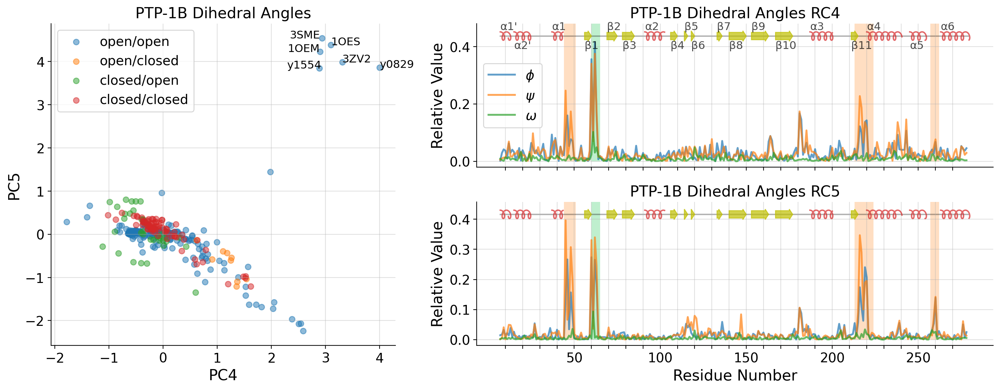

In [67]:
gs_kw = dict(width_ratios=[1, 1.5], height_ratios=[1, 1])
fig, axd = plt.subplot_mosaic(
    [["left", "upper right"], ["left", "lower right"]],
    gridspec_kw=gs_kw,
    figsize=(15, 6),
    layout="constrained",
    dpi=200,
)
tl_list = [-1, 3, 4]
for i, ax in enumerate(axd):
    axd[ax].spines['top'].set_visible(False)
    axd[ax].spines['right'].set_visible(False)
    axd[ax].grid(alpha=0.4)
    if i == 0:
        # determine conformation color
        conformations = list()
        for k in dihedral_strucs:
            if k.startswith("ptp1b_data/"):
                conformations.append(conformation_dict[k.split("/")[-1][8:-4]])
            else:
                conformations.append(conformation_dict[k])

        conformations = np.array(conformations)
        axd[ax].scatter(
            u_A[conformations == "open_open", 3],
            u_A[conformations == "open_open", 4],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            linewidth=1,
            label="open/open",
        )
        axd[ax].scatter(
            u_A[conformations == "open_closed", 3],
            u_A[conformations == "open_closed", 4],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            linewidth=1,
            label="open/closed",
        )
        axd[ax].scatter(
            u_A[conformations == "closed_open", 3],
            u_A[conformations == "closed_open", 4],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            linewidth=1,
            label="closed/open",
        )
        axd[ax].scatter(
            u_A[conformations == "closed_closed", 3],
            u_A[conformations == "closed_closed", 4],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            linewidth=1,
            label="closed/closed",
        )
        axd[ax].set_ylabel("PC5")
        axd[ax].set_xlabel("PC4")
        axd[ax].set_title("PTP-1B Dihedral Angles")
        axd[ax].legend(loc="upper right")
        
        counter = 0
        for i in np.arange(u_A.shape[0]): 
            if u_A[i,3] > 2 and u_A[i,4] > 2:
                if 'PTP1B-y' in dihedral_strucs[i]: 
                    axd[ax].annotate(dihedral_strucs[i].split("/")[-1][14:-11],
                                     (u_A[i,3], u_A[i,4]), 
                                     xytext=(u_A[i,3]-0.6 if counter % 2 == 1 else u_A[i,3], u_A[i,4]),
                                     fontsize='small'
                                    )
                else: 
                    axd[ax].annotate(dihedral_strucs[i].split("/")[-1][8:-11].upper(), 
                                     (u_A[i,3], u_A[i,4]), 
                                     xytext=(u_A[i,3]-0.6 if counter % 2 == 0 else u_A[i,3], u_A[i,4]),
                                     fontsize='small'
                                    )
                counter += 1

    else:
        psi_idx = np.arange(0, untreated_dihedrals_data.shape[1] // 2, 3)
        omg_idx = np.arange(1, untreated_dihedrals_data.shape[1] // 2, 3)
        phi_idx = np.arange(2, untreated_dihedrals_data.shape[1] // 2, 3)
        dh_range = np.arange(resnum_bounds[0], resnum_bounds[1])
        (phi_trace,) = axd[ax].plot(
            dh_range,
            calculate_dh_rc(u_pca.components_[tl_list[i]])[phi_idx],
            "-",
            label=r"$\phi$",
            linewidth=2,
            alpha=0.7,
        )
        (psi_trace,) = axd[ax].plot(
            dh_range,
            calculate_dh_rc(u_pca.components_[tl_list[i]])[psi_idx],
            "-",
            label=r"$\psi$",
            linewidth=2,
            alpha=0.7,
        )
        (omg_trace,) = axd[ax].plot(
            dh_range,
            calculate_dh_rc(u_pca.components_[tl_list[i]])[omg_idx],
            "-",
            label=r"$\omega$",
            linewidth=2,
            alpha=0.7,
        )
        ylims = axd[ax].get_ylim()
        axd[ax].set_title(f"PTP-1B Dihedral Angles RC{tl_list[i]+1}")
        axd[ax].set_xticks(
            [dh for dh in dh_range if dh % 10 == 0],
            labels=[dh if dh % 50 == 0 else '' for dh in dh_range if dh % 10 == 0],
        )

        axd[ax].add_patch(
            Rectangle(
                (213, 0),
                width=11,
                height=3.5,  # P loop
                facecolor="#ff7f0e",
                alpha=0.25,
                fill=True,
            )
        )
        axd[ax].add_patch(
            Rectangle(
                (44, 0),
                width=7,
                height=3.5,  # pY loop
                facecolor="#ff7f0e",
                alpha=0.25,
                fill=True,
            )
        )
        axd[ax].add_patch(
            Rectangle(
                (60, 0),
                width=5,
                height=3.5,  # Y loop
                facecolor="#03c03c",
                alpha=0.25,
                fill=True,
            )
        )
        axd[ax].add_patch(
            Rectangle(
                (257, 0),
                width=5,
                height=3.5,  # Q loop
                facecolor="#ff7f0e",
                alpha=0.25,
                fill=True,
            )
        )
        axd[ax].plot(np.arange(7,280), [ylims[1]]*273, alpha=0.3, color='k', linestyle='-', zorder=1)
        axd[ax].set_ylim((ylims[0], ylims[1]*1.1))
        counter = 0
        for k,v in ptp1b_ss_dict.items(): 
            if k.startswith(u'\u03b1'): 
                ts = np.linspace(v[0], v[1], num=1000)
                axd[ax].plot(ts + 1.5*np.sin((ts-v[0])*2*np.pi/3.6), (ylims[1]/30)*np.cos((ts-v[0])*2*np.pi/3.6)+ylims[1], color='tab:red', alpha=0.7, zorder=2)
                if ax == 'upper right': 
                    axd[ax].text(v[0], ylims[1]+(1.5*ylims[1]/30) if counter%2 == 0 else ylims[1]-(3*ylims[1]/30), k, fontsize='small', alpha=0.7)
                    counter += 1
            else: 
                axd[ax].arrow(v[0],ylims[1],v[1]-v[0]+1,0, width=(ylims[1]/17), head_width=(ylims[1]/12), head_length=2, ec='y', fc='y', length_includes_head=True, alpha=0.7, zorder=3)
                if ax == 'upper right': 
                    axd[ax].text(v[0], ylims[1]+(1.5*ylims[1]/30) if counter%2 == 0 else ylims[1]-(3*ylims[1]/30), k, fontsize='small', alpha=0.7)
                    counter += 1
        axd[ax].set_ylabel("Relative Value")
# PDB structures all show the oxidized conformation with sulphenyl-amide ring
# frag screen structures show BME adduct-like conformation
axd["left"].legend(loc="upper left")
axd["upper right"].set_xticklabels([])
axd["upper right"].legend(loc="center left")
axd["lower right"].set_xlabel("Residue Number")
plt.tight_layout()
plt.show()

### PCA on PDB structures only

In [36]:
pdb_strucs = list()
pdb_dihedrals_data = list()
for i, k in enumerate(dihedral_strucs):
    if "PTP1B-y" not in k:
        pdb_strucs.append(k)
        pdb_dihedrals_data.append(untreated_dihedrals_data[i, :])
pdb_dihedrals_data = np.array(pdb_dihedrals_data)

pdb_pca = PCA(n_components=10)
pdb_A = pdb_pca.fit_transform(pdb_dihedrals_data)

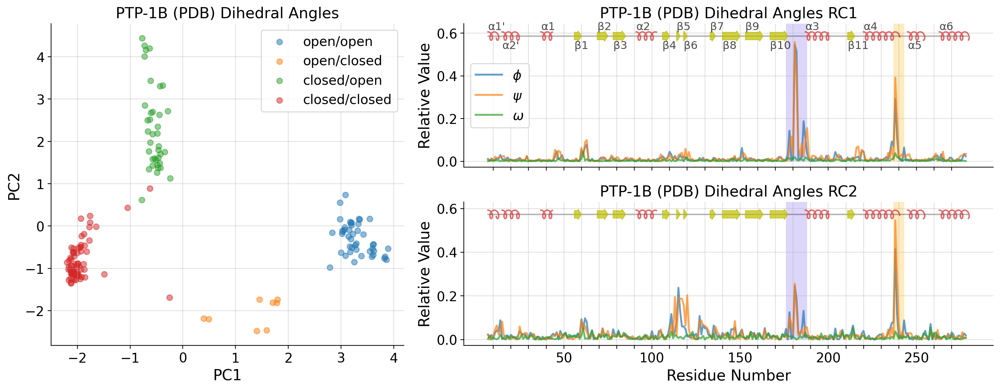

In [64]:
gs_kw = dict(width_ratios=[1, 1.5], height_ratios=[1, 1])
fig, axd = plt.subplot_mosaic(
    [["left", "upper right"], ["left", "lower right"]],
    gridspec_kw=gs_kw,
    figsize=(15, 6),
    layout="constrained",
    dpi=200,
)
tl_list = [-1, 0, 1]
for i, ax in enumerate(axd):
    axd[ax].spines['top'].set_visible(False)
    axd[ax].spines['right'].set_visible(False)
    axd[ax].grid(alpha=0.4)
    if i == 0:
        # determine conformation color
        conformations = list()
        for k in pdb_strucs:
            if k.startswith("ptp1b_data/"):
                conformations.append(conformation_dict[k.split("/")[-1][8:-4]])
            else:
                conformations.append(conformation_dict[k])

        conformations = np.array(conformations)
        axd[ax].scatter(
            pdb_A[conformations == "open_open", 0],
            pdb_A[conformations == "open_open", 1],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            linewidth=1,
            label="open/open",
        )
        axd[ax].scatter(
            pdb_A[conformations == "open_closed", 0],
            pdb_A[conformations == "open_closed", 1],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            linewidth=1,
            label="open/closed",
        )
        axd[ax].scatter(
            pdb_A[conformations == "closed_open", 0],
            pdb_A[conformations == "closed_open", 1],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            linewidth=1,
            label="closed/open",
        )
        axd[ax].scatter(
            pdb_A[conformations == "closed_closed", 0],
            pdb_A[conformations == "closed_closed", 1],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            linewidth=1,
            label="closed/closed",
        )
        axd[ax].set_ylabel("PC2")
        axd[ax].set_xlabel("PC1")
        axd[ax].set_title("PTP-1B (PDB) Dihedral Angles")
    else:
        psi_idx = np.arange(0, pdb_dihedrals_data.shape[1] // 2, 3)
        omg_idx = np.arange(1, pdb_dihedrals_data.shape[1] // 2, 3)
        phi_idx = np.arange(2, pdb_dihedrals_data.shape[1] // 2, 3)
        dh_range = np.arange(resnum_bounds[0], resnum_bounds[1])
        (phi_trace,) = axd[ax].plot(
            dh_range,
            calculate_dh_rc(pdb_pca.components_[tl_list[i]])[phi_idx],
            "-",
            label=r"$\phi$",
            linewidth=2,
            alpha=0.7,
        )
        (psi_trace,) = axd[ax].plot(
            dh_range,
            calculate_dh_rc(pdb_pca.components_[tl_list[i]])[psi_idx],
            "-",
            label=r"$\psi$",
            linewidth=2,
            alpha=0.7,
        )
        (omg_trace,) = axd[ax].plot(
            dh_range,
            calculate_dh_rc(pdb_pca.components_[tl_list[i]])[omg_idx],
            "-",
            label=r"$\omega$",
            linewidth=2,
            alpha=0.7,
        )
        ylims = axd[ax].get_ylim()
        axd[ax].set_title(
            f"PTP-1B (PDB) Dihedral Angles RC{tl_list[i]+1}"
        )
        axd[ax].set_xticks(
            [dh for dh in dh_range if dh % 10 == 0],
            labels=[dh if dh % 50 == 0 else '' for dh in dh_range if dh % 10 == 0],
        )

        axd[ax].add_patch(
            Rectangle(
                (176, 0),
                width=12,
                height=3.5,  # WPD loop
                facecolor="#785EF0",
                alpha=0.25,
                fill=True,
            )
        )
        axd[ax].add_patch(
            Rectangle(
                (237, 0),
                width=6,
                height=3.5,  # L16 loop
                facecolor="#FFB000",
                alpha=0.25,
                fill=True,
            )
        )
        axd[ax].plot(np.arange(7,280), [ylims[1]]*273, alpha=0.3, color='k', linestyle='-', zorder=1)
        axd[ax].set_ylim((ylims[0], ylims[1]*1.1))
        counter = 0
        for k,v in ptp1b_ss_dict.items(): 
            if k.startswith(u'\u03b1'): 
                ts = np.linspace(v[0], v[1], num=1000)
                axd[ax].plot(ts + 1.5*np.sin((ts-v[0])*2*np.pi/3.6), (ylims[1]/30)*np.cos((ts-v[0])*2*np.pi/3.6)+ylims[1], color='tab:red', alpha=0.7, zorder=2)
                if ax == 'upper right': 
                    axd[ax].text(v[0], ylims[1]+(1.5*ylims[1]/30) if counter%2 == 0 else ylims[1]-(3*ylims[1]/30), k, fontsize='small', alpha=0.7)
                    counter += 1
            else: 
                axd[ax].arrow(v[0],ylims[1],v[1]-v[0]+1,0, width=(ylims[1]/17), head_width=(ylims[1]/12), head_length=2, ec='y', fc='y', length_includes_head=True, alpha=0.7, zorder=3)
                if ax == 'upper right': 
                    axd[ax].text(v[0], ylims[1]+(1.5*ylims[1]/30) if counter%2 == 0 else ylims[1]-(3*ylims[1]/30), k, fontsize='small', alpha=0.7)
                    counter += 1
        axd[ax].set_ylabel("Relative Value")
axd["left"].legend(loc="best")
axd["upper right"].set_xticklabels([])
axd["upper right"].legend(loc="center left")
axd["lower right"].set_xlabel("Residue Number")
plt.tight_layout()
plt.show()

### PCA on crystallographic drug fragment screen structures

In [38]:
fragment_strucs = list()
fragment_dihedrals_data = list()
for i, k in enumerate(dihedral_strucs):
    if "PTP1B-y" in k:
        fragment_strucs.append(k)
        fragment_dihedrals_data.append(untreated_dihedrals_data[i, :])
fragment_dihedrals_data = np.array(fragment_dihedrals_data)

fragment_pca = PCA(n_components=10)
fragment_A = fragment_pca.fit_transform(fragment_dihedrals_data)

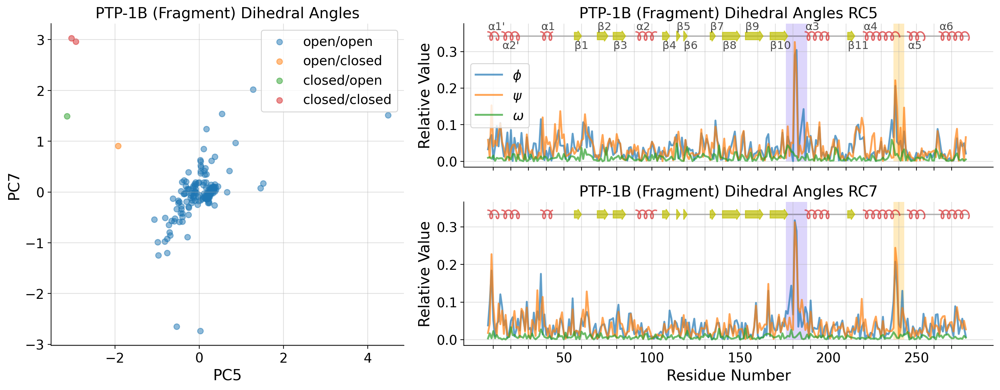

In [65]:
gs_kw = dict(width_ratios=[1, 1.5], height_ratios=[1, 1])
fig, axd = plt.subplot_mosaic(
    [["left", "upper right"], ["left", "lower right"]],
    gridspec_kw=gs_kw,
    figsize=(15, 6),
    layout="constrained",
    dpi=200,
)
tl_list = [-1, 4, 6]
for i, ax in enumerate(axd):
    axd[ax].spines['top'].set_visible(False)
    axd[ax].spines['right'].set_visible(False)
    axd[ax].grid(alpha=0.4)
    if i == 0:
        # determine conformation color
        conformations = list()
        for k in fragment_strucs:
            if k.startswith("ptp1b_data/"):
                conformations.append(conformation_dict[k.split("/")[-1][8:-4]])
            else:
                conformations.append(conformation_dict[k])

        conformations = np.array(conformations)
        axd[ax].scatter(
            fragment_A[conformations == "open_open", tl_list[1]],
            fragment_A[conformations == "open_open", tl_list[2]],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            linewidth=1,
            label="open/open",
        )
        axd[ax].scatter(
            fragment_A[conformations == "open_closed", tl_list[1]],
            fragment_A[conformations == "open_closed", tl_list[2]],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            linewidth=1,
            label="open/closed",
        )
        axd[ax].scatter(
            fragment_A[conformations == "closed_open", tl_list[1]],
            fragment_A[conformations == "closed_open", tl_list[2]],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            linewidth=1,
            label="closed/open",
        )
        axd[ax].scatter(
            fragment_A[conformations == "closed_closed", tl_list[1]],
            fragment_A[conformations == "closed_closed", tl_list[2]],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            linewidth=1,
            label="closed/closed",
        )
        axd[ax].set_ylabel(f"PC{tl_list[2]+1}")
        axd[ax].set_xlabel(f"PC{tl_list[1]+1}")
        axd[ax].set_title("PTP-1B (Fragment) Dihedral Angles")
        axd[ax].legend(loc="upper right")

    else:
        psi_idx = np.arange(0, fragment_dihedrals_data.shape[1] // 2, 3)
        omg_idx = np.arange(1, fragment_dihedrals_data.shape[1] // 2, 3)
        phi_idx = np.arange(2, fragment_dihedrals_data.shape[1] // 2, 3)
        dh_range = np.arange(resnum_bounds[0], resnum_bounds[1])
        (phi_trace,) = axd[ax].plot(
            dh_range,
            calculate_dh_rc(fragment_pca.components_[tl_list[i]])[phi_idx],
            "-",
            label=r"$\phi$",
            linewidth=2,
            alpha=0.7,
        )
        (psi_trace,) = axd[ax].plot(
            dh_range,
            calculate_dh_rc(fragment_pca.components_[tl_list[i]])[psi_idx],
            "-",
            label=r"$\psi$",
            linewidth=2,
            alpha=0.7,
        )
        (omg_trace,) = axd[ax].plot(
            dh_range,
            calculate_dh_rc(fragment_pca.components_[tl_list[i]])[omg_idx],
            "-",
            label=r"$\omega$",
            linewidth=2,
            alpha=0.7,
        )
        ylims = axd[ax].get_ylim()
        axd[ax].set_title(
            f"PTP-1B (Fragment) Dihedral Angles RC{tl_list[i]+1}"
        )
        axd[ax].set_xticks(
            [dh for dh in dh_range if dh % 10 == 0],
            labels=[dh if dh % 50 == 0 else '' for dh in dh_range if dh % 10 == 0],
        )

        axd[ax].add_patch(
            Rectangle(
                (176, 0),
                width=12,
                height=3.5,  # WPD loop
                facecolor="#785EF0",
                alpha=0.25,
                fill=True,
            )
        )
        axd[ax].add_patch(
            Rectangle(
                (237, 0),
                width=6,
                height=3.5,  # L16 loop
                facecolor="#FFB000",
                alpha=0.25,
                fill=True,
            )
        )

        axd[ax].plot(np.arange(7,280), [ylims[1]]*273, alpha=0.3, color='k', linestyle='-', zorder=1)
        axd[ax].set_ylim((ylims[0], ylims[1]*1.1))
        counter = 0
        for k,v in ptp1b_ss_dict.items(): 
            if k.startswith(u'\u03b1'): 
                ts = np.linspace(v[0], v[1], num=1000)
                axd[ax].plot(ts + 1.5*np.sin((ts-v[0])*2*np.pi/3.6), (ylims[1]/30)*np.cos((ts-v[0])*2*np.pi/3.6)+ylims[1], color='tab:red', alpha=0.7, zorder=2)
                if ax == 'upper right': 
                    axd[ax].text(v[0], ylims[1]+(1.5*ylims[1]/30) if counter%2 == 0 else ylims[1]-(3*ylims[1]/30), k, fontsize='small', alpha=0.7)
                    counter += 1
            else: 
                axd[ax].arrow(v[0],ylims[1],v[1]-v[0]+1,0, width=(ylims[1]/17), head_width=(ylims[1]/12), head_length=2, ec='y', fc='y', length_includes_head=True, alpha=0.7, zorder=3)
                if ax == 'upper right': 
                    axd[ax].text(v[0], ylims[1]+(1.5*ylims[1]/30) if counter%2 == 0 else ylims[1]-(3*ylims[1]/30), k, fontsize='small', alpha=0.7)
                    counter += 1
        axd[ax].set_ylabel("Relative Value")
axd["left"].legend(loc="best")
axd["upper right"].set_xticklabels([])
axd["upper right"].legend(loc="center left")
axd["lower right"].set_xlabel("Residue Number")
plt.tight_layout()
plt.show()

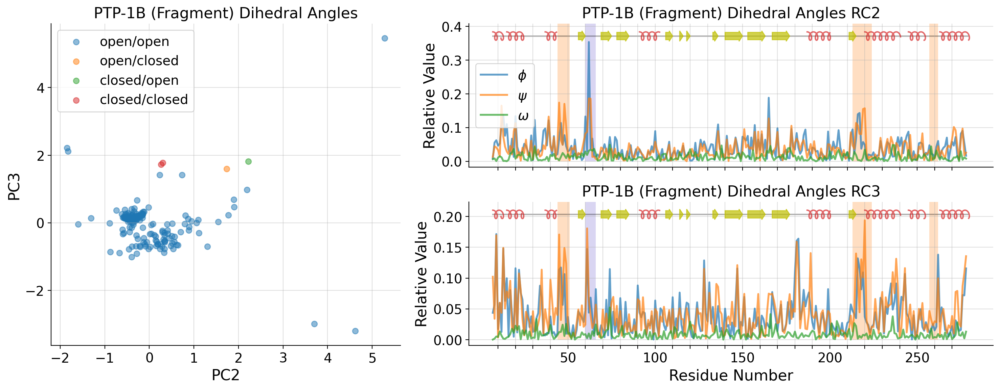

In [66]:
gs_kw = dict(width_ratios=[1, 1.5], height_ratios=[1, 1])
fig, axd = plt.subplot_mosaic(
    [["left", "upper right"], ["left", "lower right"]],
    gridspec_kw=gs_kw,
    figsize=(15, 6),
    layout="constrained",
    dpi=200,
)
tl_list = [-1, 1, 2]
for i, ax in enumerate(axd):
    axd[ax].spines['top'].set_visible(False)
    axd[ax].spines['right'].set_visible(False)
    axd[ax].grid(alpha=0.4)
    if i == 0:
        # determine conformation color
        conformations = list()
        for k in fragment_strucs:
            if k.startswith("ptp1b_data/"):
                conformations.append(conformation_dict[k.split("/")[-1][8:-4]])
            else:
                conformations.append(conformation_dict[k])

        conformations = np.array(conformations)
        axd[ax].scatter(
            fragment_A[conformations == "open_open", tl_list[1]],
            fragment_A[conformations == "open_open", tl_list[2]],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            linewidth=1,
            label="open/open",
        )
        axd[ax].scatter(
            fragment_A[conformations == "open_closed", tl_list[1]],
            fragment_A[conformations == "open_closed", tl_list[2]],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            linewidth=1,
            label="open/closed",
        )
        axd[ax].scatter(
            fragment_A[conformations == "closed_open", tl_list[1]],
            fragment_A[conformations == "closed_open", tl_list[2]],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            linewidth=1,
            label="closed/open",
        )
        axd[ax].scatter(
            fragment_A[conformations == "closed_closed", tl_list[1]],
            fragment_A[conformations == "closed_closed", tl_list[2]],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            linewidth=1,
            label="closed/closed",
        )
        axd[ax].set_ylabel(f"PC{tl_list[2]+1}")
        axd[ax].set_xlabel(f"PC{tl_list[1]+1}")
        axd[ax].set_title("PTP-1B (Fragment) Dihedral Angles")
        axd[ax].legend(loc="upper right")

    else:
        psi_idx = np.arange(0, fragment_dihedrals_data.shape[1] // 2, 3)
        omg_idx = np.arange(1, fragment_dihedrals_data.shape[1] // 2, 3)
        phi_idx = np.arange(2, fragment_dihedrals_data.shape[1] // 2, 3)
        dh_range = np.arange(resnum_bounds[0], resnum_bounds[1])
        (phi_trace,) = axd[ax].plot(
            dh_range,
            calculate_dh_rc(fragment_pca.components_[tl_list[i]])[phi_idx],
            "-",
            label=r"$\phi$",
            linewidth=2,
            alpha=0.7,
        )
        (psi_trace,) = axd[ax].plot(
            dh_range,
            calculate_dh_rc(fragment_pca.components_[tl_list[i]])[psi_idx],
            "-",
            label=r"$\psi$",
            linewidth=2,
            alpha=0.7,
        )
        (omg_trace,) = axd[ax].plot(
            dh_range,
            calculate_dh_rc(fragment_pca.components_[tl_list[i]])[omg_idx],
            "-",
            label=r"$\omega$",
            linewidth=2,
            alpha=0.7,
        )
        ylims = axd[ax].get_ylim()
        axd[ax].set_title(
            f"PTP-1B (Fragment) Dihedral Angles RC{tl_list[i]+1}"
        )
        axd[ax].set_xticks(
            [dh for dh in dh_range if dh % 10 == 0],
            labels=[dh if dh % 50 == 0 else '' for dh in dh_range if dh % 10 == 0],
        )

        axd[ax].add_patch(
            Rectangle(
                (213, 0),
                width=11,
                height=3.5,  # P loop
                facecolor="#ff7f0e",
                alpha=0.25,
                fill=True,
            )
        )
        axd[ax].add_patch(
            Rectangle(
                (44, 0),
                width=7,
                height=3.5,  # pY loop
                facecolor="#ff7f0e",
                alpha=0.25,
                fill=True,
            )
        )
        axd[ax].add_patch(
            Rectangle(
                (60, 0),
                width=6,
                height=3.5,  # Y loop
                facecolor="slateblue",
                alpha=0.25,
                fill=True,
            )
        )
        axd[ax].add_patch(
            Rectangle(
                (257, 0),
                width=5,
                height=3.5,  # Q loop
                facecolor="#ff7f0e",
                alpha=0.25,
                fill=True,
            )
        )

        axd[ax].plot(np.arange(7,280), [ylims[1]]*273, alpha=0.3, color='k', linestyle='-', zorder=1)
        axd[ax].set_ylim((ylims[0], ylims[1]*1.1))
        counter = 0
        for k,v in ptp1b_ss_dict.items(): 
            if k.startswith(u'\u03b1'): 
                ts = np.linspace(v[0], v[1], num=1000)
                axd[ax].plot(ts + 1.5*np.sin((ts-v[0])*2*np.pi/3.6), (ylims[1]/30)*np.cos((ts-v[0])*2*np.pi/3.6)+ylims[1], color='tab:red', alpha=0.7, zorder=2)
#                 if ax == 'upper right': 
#                     axd[ax].text(v[0], ylims[1]+(1.5*ylims[1]/30) if counter%2 == 0 else ylims[1]-(3*ylims[1]/30), k, fontsize='small', alpha=0.7)
#                     counter += 1
            else: 
                axd[ax].arrow(v[0],ylims[1],v[1]-v[0]+1,0, width=(ylims[1]/17), head_width=(ylims[1]/12), head_length=2, ec='y', fc='y', length_includes_head=True, alpha=0.7, zorder=3)
#                 if ax == 'upper right': 
#                     axd[ax].text(v[0], ylims[1]+(1.5*ylims[1]/30) if counter%2 == 0 else ylims[1]-(3*ylims[1]/30), k, fontsize='small', alpha=0.7)
#                     counter += 1
        axd[ax].set_ylabel("Relative Value")
axd["left"].legend(loc="best")
axd["upper right"].set_xticklabels([])
axd["upper right"].legend(loc="center left")
axd["lower right"].set_xlabel("Residue Number")
plt.tight_layout()
plt.show()

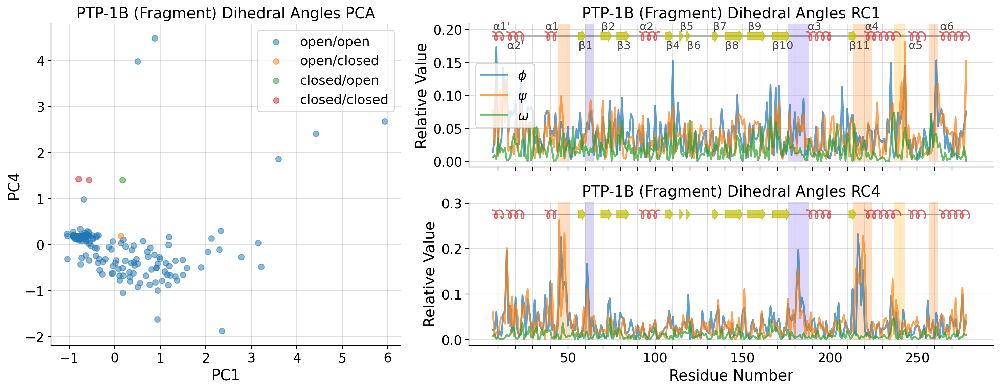

In [41]:
gs_kw = dict(width_ratios=[1, 1.5], height_ratios=[1, 1])
fig, axd = plt.subplot_mosaic(
    [["left", "upper right"], ["left", "lower right"]],
    gridspec_kw=gs_kw,
    figsize=(15, 6),
    layout="constrained",
    dpi=200,
)
tl_list = [-1, 0, 3]
for i, ax in enumerate(axd):
    axd[ax].spines['top'].set_visible(False)
    axd[ax].spines['right'].set_visible(False)
    axd[ax].grid(alpha=0.4)
    if i == 0:
        # determine conformation color
        conformations = list()
        for k in fragment_strucs:
            if k.startswith("ptp1b_data/"):
                conformations.append(conformation_dict[k.split("/")[-1][8:-4]])
            else:
                conformations.append(conformation_dict[k])

        conformations = np.array(conformations)
        axd[ax].scatter(
            fragment_A[conformations == "open_open", tl_list[1]],
            fragment_A[conformations == "open_open", tl_list[2]],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            linewidth=1,
            label="open/open",
        )
        axd[ax].scatter(
            fragment_A[conformations == "open_closed", tl_list[1]],
            fragment_A[conformations == "open_closed", tl_list[2]],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            linewidth=1,
            label="open/closed",
        )
        axd[ax].scatter(
            fragment_A[conformations == "closed_open", tl_list[1]],
            fragment_A[conformations == "closed_open", tl_list[2]],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            linewidth=1,
            label="closed/open",
        )
        axd[ax].scatter(
            fragment_A[conformations == "closed_closed", tl_list[1]],
            fragment_A[conformations == "closed_closed", tl_list[2]],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            linewidth=1,
            label="closed/closed",
        )
        axd[ax].set_ylabel(f"PC{tl_list[2]+1}")
        axd[ax].set_xlabel(f"PC{tl_list[1]+1}")
        axd[ax].set_title("PTP-1B (Fragment) Dihedral Angles PCA")
        axd[ax].legend(loc="upper right")

    else:
        psi_idx = np.arange(0, fragment_dihedrals_data.shape[1] // 2, 3)
        omg_idx = np.arange(1, fragment_dihedrals_data.shape[1] // 2, 3)
        phi_idx = np.arange(2, fragment_dihedrals_data.shape[1] // 2, 3)
        dh_range = np.arange(resnum_bounds[0], resnum_bounds[1])
        (phi_trace,) = axd[ax].plot(
            dh_range,
            calculate_dh_rc(fragment_pca.components_[tl_list[i]])[phi_idx],
            "-",
            label=r"$\phi$",
            linewidth=2,
            alpha=0.7,
        )
        (psi_trace,) = axd[ax].plot(
            dh_range,
            calculate_dh_rc(fragment_pca.components_[tl_list[i]])[psi_idx],
            "-",
            label=r"$\psi$",
            linewidth=2,
            alpha=0.7,
        )
        (omg_trace,) = axd[ax].plot(
            dh_range,
            calculate_dh_rc(fragment_pca.components_[tl_list[i]])[omg_idx],
            "-",
            label=r"$\omega$",
            linewidth=2,
            alpha=0.7,
        )
        ylims = axd[ax].get_ylim()
        axd[ax].set_title(
            f"PTP-1B (Fragment) Dihedral Angles RC{tl_list[i]+1}"
        )
        axd[ax].set_xticks(
            [dh for dh in dh_range if dh % 10 == 0],
            labels=[dh if dh % 50 == 0 else '' for dh in dh_range if dh % 10 == 0],
        )

        axd[ax].add_patch(
            Rectangle(
                (176, 0),
                width=12,
                height=3.5,  # WPD loop
                facecolor="#785EF0",
                alpha=0.25,
                fill=True,
            )
        )
        axd[ax].add_patch(
            Rectangle(
                (237, 0),
                width=6,
                height=3.5,  # L16 loop
                facecolor="#FFB000",
                alpha=0.25,
                fill=True,
            )
        )        
        axd[ax].add_patch(
            Rectangle(
                (213, 0),
                width=11,
                height=3.5,  # P loop
                facecolor="#ff7f0e",
                alpha=0.25,
                fill=True,
            )
        )
        axd[ax].add_patch(
            Rectangle(
                (44, 0),
                width=7,
                height=3.5,  # pY loop
                facecolor="#ff7f0e",
                alpha=0.25,
                fill=True,
            )
        )
        axd[ax].add_patch(
            Rectangle(
                (60, 0),
                width=5,
                height=3.5,  # Y loop
                facecolor="slateblue",
                alpha=0.25,
                fill=True,
            )
        )
        axd[ax].add_patch(
            Rectangle(
                (257, 0),
                width=5,
                height=3.5,  # Q loop
                facecolor="#ff7f0e",
                alpha=0.25,
                fill=True,
            )
        )

        axd[ax].plot(np.arange(7,280), [ylims[1]]*273, alpha=0.3, color='k', linestyle='-', zorder=1)
        axd[ax].set_ylim((ylims[0], ylims[1]*1.1))
        counter = 0
        for k,v in ptp1b_ss_dict.items(): 
            if k.startswith(u'\u03b1'): 
                ts = np.linspace(v[0], v[1], num=1000)
                axd[ax].plot(ts + 1.5*np.sin((ts-v[0])*2*np.pi/3.6), (ylims[1]/30)*np.cos((ts-v[0])*2*np.pi/3.6)+ylims[1], color='tab:red', alpha=0.7, zorder=2)
                if ax == 'upper right': 
                    axd[ax].text(v[0], ylims[1]+(1.5*ylims[1]/30) if counter%2 == 0 else ylims[1]-(3*ylims[1]/30), k, fontsize='small', alpha=0.7)
                    counter += 1
            else: 
                axd[ax].arrow(v[0],ylims[1],v[1]-v[0]+1,0, width=(ylims[1]/17), head_width=(ylims[1]/12), head_length=2, ec='y', fc='y', length_includes_head=True, alpha=0.7, zorder=3)
                if ax == 'upper right': 
                    axd[ax].text(v[0], ylims[1]+(1.5*ylims[1]/30) if counter%2 == 0 else ylims[1]-(3*ylims[1]/30), k, fontsize='small', alpha=0.7)
                    counter += 1
        axd[ax].set_ylabel("Relative Value")
axd["left"].legend(loc="best")
axd["upper right"].set_xticklabels([])
axd["upper right"].legend(loc="center left")
axd["lower right"].set_xlabel("Residue Number")
plt.tight_layout()
plt.show()

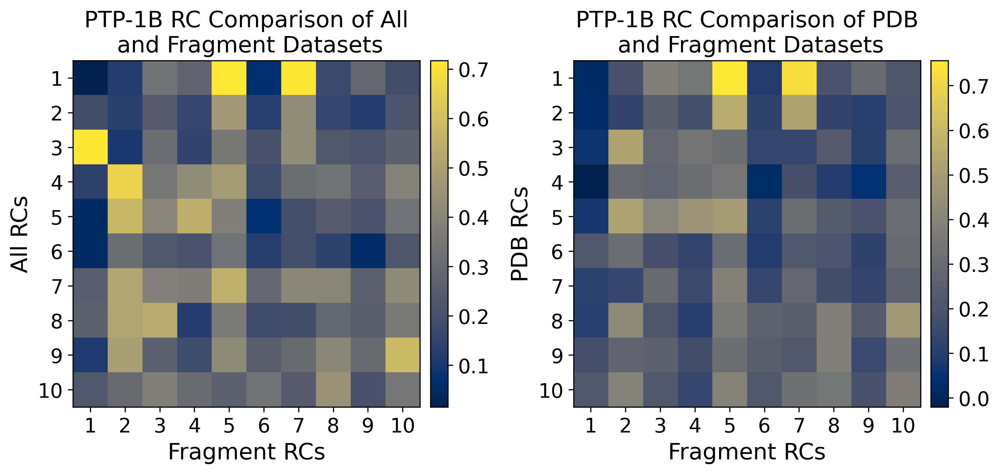

In [42]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5), dpi=300)
ax = ax.flatten()
dot_matrix_all = list()
dot_matrix_pdb = list()
for i in np.arange(10):
    for j in np.arange(10):
        dot_matrix_all.append(
            pearsonr(
                calculate_dh_rc(u_pca.components_[i, :])[psi_idx]
                + calculate_dh_rc(u_pca.components_[i, :])[phi_idx]
                + calculate_dh_rc(u_pca.components_[i, :])[omg_idx],
                calculate_dh_rc(fragment_pca.components_[j, :])[psi_idx]
                + calculate_dh_rc(fragment_pca.components_[j, :])[phi_idx]
                + calculate_dh_rc(fragment_pca.components_[j, :])[omg_idx]
            )[0]
        )
        dot_matrix_pdb.append(
            pearsonr(
                calculate_dh_rc(pdb_pca.components_[i, :])[psi_idx]
                + calculate_dh_rc(pdb_pca.components_[i, :])[phi_idx]
                + calculate_dh_rc(pdb_pca.components_[i, :])[omg_idx],
                calculate_dh_rc(fragment_pca.components_[j, :])[psi_idx]
                + calculate_dh_rc(fragment_pca.components_[j, :])[phi_idx]
                + calculate_dh_rc(fragment_pca.components_[j, :])[omg_idx],
            )[0]
        )

dot_matrix_all = np.array(dot_matrix_all).reshape(10, 10)
dot_matrix_pdb = np.array(dot_matrix_pdb).reshape(10, 10)
for i in np.arange(2): 
    im = ax[i].imshow(dot_matrix_all if i == 0 else dot_matrix_pdb, cmap="cividis", interpolation=None)
    divider = make_axes_locatable(ax[i])
    cax = divider.append_axes("right", "5%", pad="3%")
    plt.colorbar(im, cax=cax)
    ax[i].set_xticks(np.arange(10), labels=np.arange(1,11))
    ax[i].set_yticks(np.arange(10), labels=np.arange(1,11))
    ax[i].set_xlabel("Fragment RCs")
    ax[i].set_ylabel("All RCs" if i == 0 else "PDB RCs")
    ax[i].set_title("PTP-1B RC Comparison of All\n and Fragment Datasets" if i == 0 else "PTP-1B RC Comparison of PDB\n and Fragment Datasets")

plt.tight_layout()
plt.show()

### COV and MAT score calculations

In [43]:
# calculate_coverage_matching_scores(pdb_strucs, fragment_strucs, (7,279), rmsd_threshold=1.0, verbose=True)

Coverage metric: 96.3%
Matching metric: 0.493


(0.9629629629629629, 0.49268775667528564)

In [44]:
len(pdb_strucs), len(fragment_strucs)

(162, 187)

### Conformational changes focusing on individual PCs

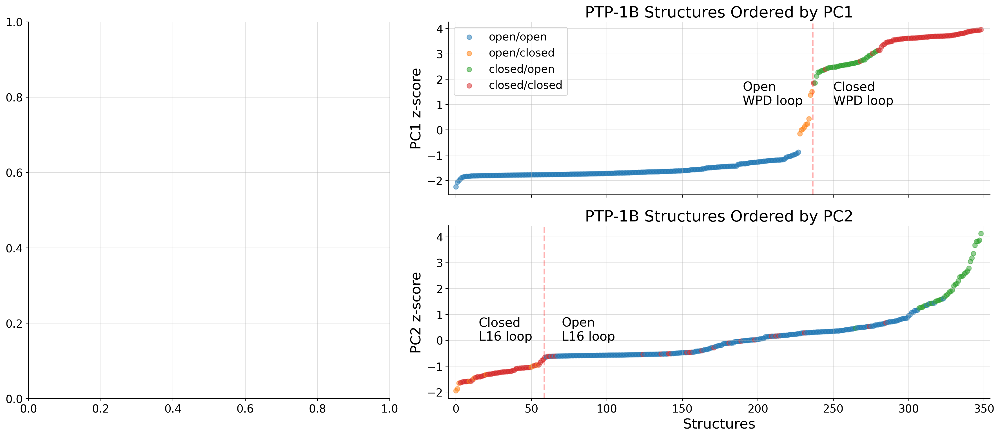

In [60]:
# allosteric steering 
gs_kw = dict(width_ratios=[1, 1.5], height_ratios=[1, 1])
fig, axd = plt.subplot_mosaic(
    [["left", "upper right"], ["left", "lower right"]],
    gridspec_kw=gs_kw,
    figsize=(18, 8),
    layout="constrained",
    dpi=200,
)
pc1_idxs = np.argsort(u_A[:, 0])
pc2_idxs = np.argsort(u_A[:, 1])
idx_list = [pc1_idxs, pc2_idxs]
for idx, ax in enumerate(axd):
    axd[ax].spines['top'].set_visible(False)
    axd[ax].spines['right'].set_visible(False)
    axd[ax].grid(alpha=0.4)

    if idx == 0:
        pass
    else:
        c_dict = {
            "open_open": "#1f77b4",
            "open_closed": "#ff7f0e",
            "closed_open": "#2ca02c",
            "closed_closed": "#d62728",
        }
        conformations = list()
        for i in np.array(dihedral_strucs)[idx_list[idx - 1]]:
            if i.startswith("ptp1b_data/ptp1b_theseus_data/"):
                conformations.append(c_dict[conformation_dict[i.split("/")[-1][8:-4]]])
            else:
                conformations.append(c_dict[conformation_dict[i]])
        conformations = np.array(conformations)

        axd[ax].scatter(
            np.arange(u_A.shape[0]),
            u_A[idx_list[idx - 1], idx - 1],
            c=conformations,
            alpha=0.5,
            marker="o",
            edgecolor=None,
        )
        if idx == 1: 
            axd[ax].axvline(236.5, linestyle='--', linewidth=2, alpha=0.3, color='r')
            axd[ax].text(190, 1, 'Open\nWPD loop', fontsize=16)
            axd[ax].text(250, 1, 'Closed\nWPD loop', fontsize=16)
        elif idx == 2: 
            axd[ax].axvline(58.5, linestyle='--', linewidth=2, alpha=0.3, color='r')
            axd[ax].text(15, 0, 'Closed\nL16 loop', fontsize=16)
            axd[ax].text(70, 0, 'Open\nL16 loop', fontsize=16)
        axd[ax].set_ylabel(f"PC{idx} z-score", fontsize=18)
        axd[ax].set_title(f"PTP-1B Structures Ordered by PC{idx}", fontsize=20)
        axd[ax].set_xlim(left=-5, right=u_A.shape[0] + 5)

        axd["upper right"].legend(
            loc="upper left",
            handles=[cluster1, cluster2, cluster3, cluster4],
            labels=["open/open", "open/closed", "closed/open", "closed/closed"],
        )
axd["upper right"].set_xticklabels([])
axd["lower right"].set_xlabel("Structures", fontsize=18)
plt.tight_layout()
plt.show()

## Supplementary Figures

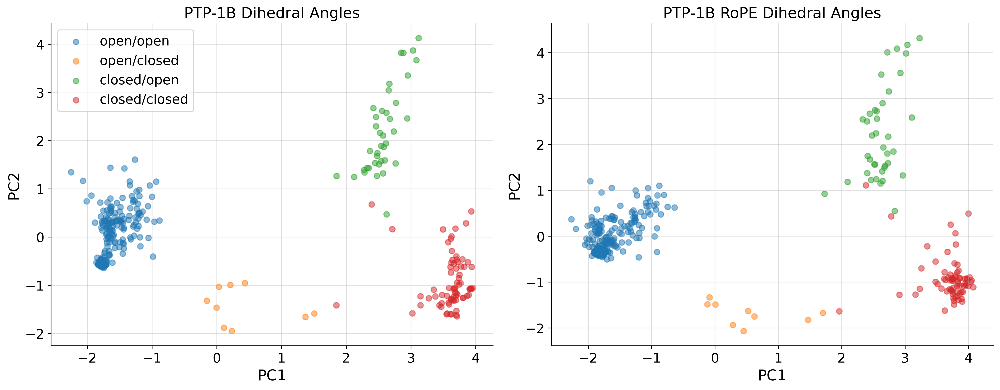

In [46]:
# PC space plots
fig, ax = plt.subplots(1, 2, figsize=(15,6), dpi=300)
ax = ax.flatten()
pca_list = [u_A, rope_A, pw_A]
struc_list_list = [dihedral_strucs, rope_strucs, pw_strucs]
title_list = ["Dihedral Angles", "RoPE Dihedral Angles", "C\u03b1 Pairwise Distances"]

# enumerate the axes and the list of the PCAs
for i in np.arange(2):
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['right'].set_visible(False)
    ax[i].grid(alpha=0.4)
    # determine conformation color
    conformations = list()
    for k in struc_list_list[i]:
        if k.startswith("ptp1b_data/"):
            conformations.append(conformation_dict[k.split("/")[-1][8:-4]])
        else:
            conformations.append(conformation_dict[k])

    conformations = np.array(conformations)
    cluster1 = ax[i].scatter(
        pca_list[i][conformations == "open_open", 0],
        pca_list[i][conformations == "open_open", 1],
        marker="o",
        alpha=0.5,
        edgecolor=None,
        linewidth=1,
        label="open/open",
    )
    cluster2 = ax[i].scatter(
        pca_list[i][conformations == "open_closed", 0],
        pca_list[i][conformations == "open_closed", 1],
        marker="o",
        alpha=0.5,
        edgecolor=None,
        linewidth=1,
        label="open/closed",
    )
    cluster3 = ax[i].scatter(
        pca_list[i][conformations == "closed_open", 0],
        pca_list[i][conformations == "closed_open", 1],
        marker="o",
        alpha=0.5,
        edgecolor=None,
        linewidth=1,
        label="closed/open",
    )
    cluster4 = ax[i].scatter(
        pca_list[i][conformations == "closed_closed", 0],
        pca_list[i][conformations == "closed_closed", 1],
        marker="o",
        alpha=0.5,
        edgecolor=None,
        linewidth=1,
        label="closed/closed",
    )
    ax[i].set_ylabel("PC2")
    ax[i].set_xlabel("PC1")
    ax[i].set_title("PTP-1B " + title_list[i])
ax[0].legend(
    loc="upper left",
    handles=[cluster1, cluster2, cluster3, cluster4],
    labels=["open/open", "open/closed", "closed/open", "closed/closed"],
)
plt.tight_layout()
plt.show()

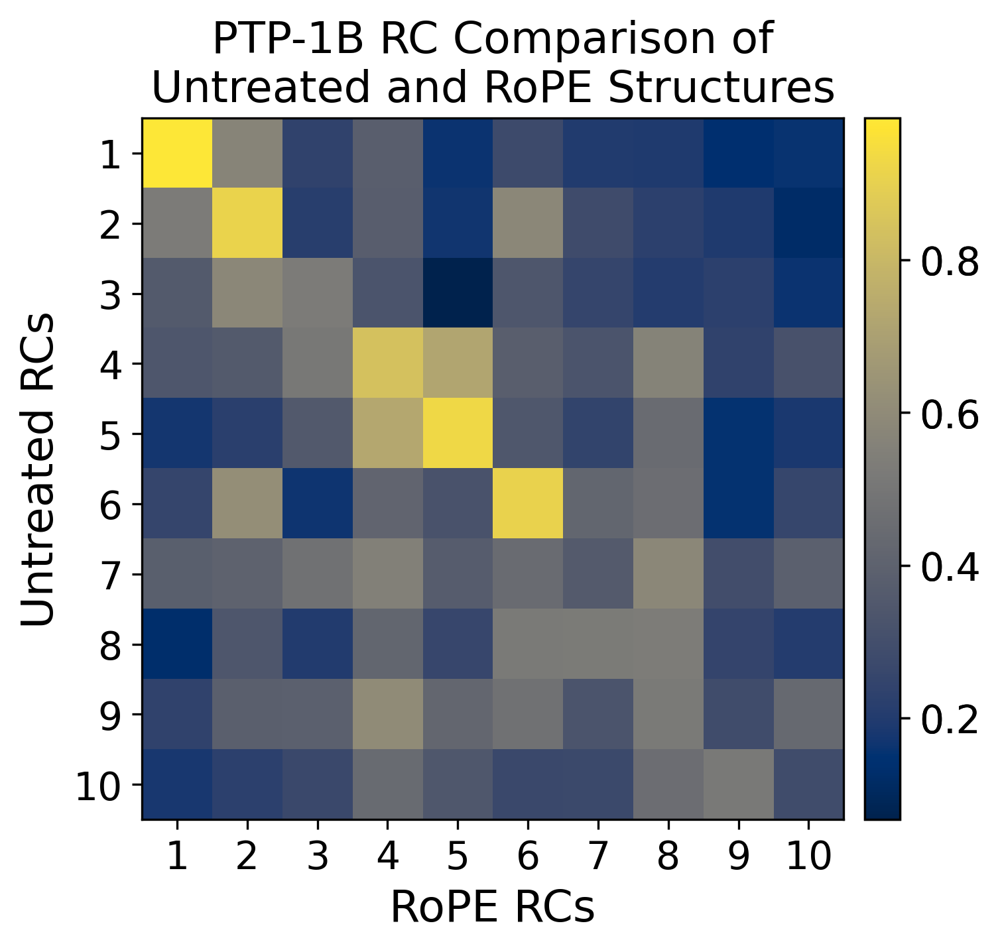

In [47]:
fig, ax = plt.subplots(figsize=(10, 5), dpi=300)
# ax = ax.flatten()
dot_matrix_rope = list()
for i in np.arange(10):
    for j in np.arange(10):
        dot_matrix_rope.append(
            pearsonr(
                calculate_dh_rc(u_pca.components_[i, :])[psi_idx]
                + calculate_dh_rc(u_pca.components_[i, :])[phi_idx]
                + calculate_dh_rc(u_pca.components_[i, :])[omg_idx],
                calculate_dh_rc(rope_pca.components_[j, :])[psi_idx]
                + calculate_dh_rc(rope_pca.components_[j, :])[phi_idx]
                + calculate_dh_rc(rope_pca.components_[j, :])[omg_idx],
            )[0]
        )

dot_matrix_rope = np.array(dot_matrix_rope).reshape(10, 10)

for i in np.arange(2): 
    im = ax.imshow(dot_matrix_rope, cmap="cividis", interpolation=None)
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", "5%", pad="3%")
    plt.colorbar(im, cax=cax)
    ax.set_xticks(np.arange(10), labels=np.arange(1,11))
    ax.set_yticks(np.arange(10), labels=np.arange(1,11))
    ax.set_xlabel("RoPE RCs")
    ax.set_ylabel("Untreated RCs")
    ax.set_title("PTP-1B RC Comparison of\nUntreated and RoPE Structures")

plt.tight_layout()
plt.show()

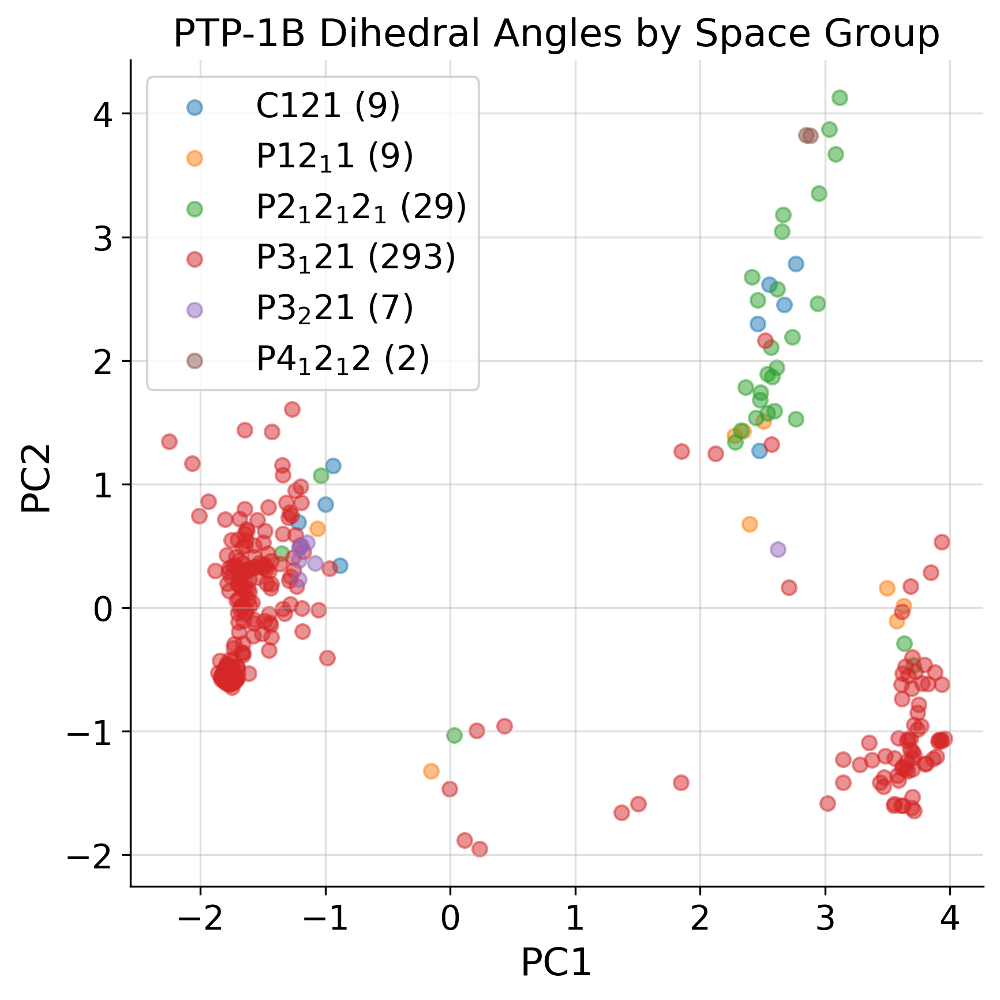

In [48]:
# determine the space groups of each of the structures
sgs = list()
for i, struc in enumerate(dihedral_strucs):
    sgs.append(space_group_dict[struc.split("/")[-1].split("_")[-2]])
sgs = np.array(sgs)

# PC plot by space group
fig, ax = plt.subplots(1, 1, figsize=(6, 6), dpi=300)  # ; ax = ax.flatten()
# for k in np.arange(1):
for i, sg in enumerate(np.unique(sgs)):
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.grid(alpha=0.4)
    ax.scatter(
        u_A[sgs == sg, 0],
        u_A[sgs == sg, 1],
        marker="o",
        edgecolor=None,
        label=f"{sg} ({(sgs== sg).sum()})",
        alpha=0.5,
    )
    ax.set_xlabel("PC1")
    ax.set_ylabel("PC2")
    ax.set_title("PTP-1B Dihedral Angles by Space Group")
ax.legend()
plt.tight_layout()
plt.show()

In [49]:
conf_list = list()
sg_list = list()
for i,k in enumerate(dihedral_strucs): 
    
    sg_list.append(space_group_dict[k.split("/")[-1].split("_")[-2]])
    conf_list.append(conformation_dict[k.split("/")[-1][8:-4]])
sg_unq = np.unique(sg_list, return_counts=True, return_inverse=True)
conf_unq = np.unique(conf_list, return_counts=True, return_inverse=True)
ctable = np.zeros((4,6))
for j in np.arange(len(dihedral_strucs)): 
    
    ctable[conf_unq[1][j],sg_unq[1][j]] += 1
ctable

array([[  0.,   4.,   2.,  67.,   0.,   0.],
       [  5.,   3.,  24.,   4.,   1.,   2.],
       [  0.,   1.,   1.,   7.,   0.,   0.],
       [  4.,   1.,   2., 215.,   6.,   0.]])

In [50]:
chi2_contingency(ctable).pvalue

2.3184328298516617e-40

In [72]:
# calculate t-SNE and UMAP
random_state = 0
u_tsne = TSNE(random_state=random_state, init='random', learning_rate='auto')
u_umap = UMAP(n_neighbors=50, random_state=random_state, init='random')
u_tsne_transform = u_tsne.fit_transform(untreated_dihedrals_data)
u_umap_transform = u_umap.fit_transform(untreated_dihedrals_data)

pw_tsne = TSNE(random_state=random_state, init='random', learning_rate='auto')
pw_umap = UMAP(n_neighbors=50, random_state=random_state, init='random')
pw_tsne_transform = pw_tsne.fit_transform(pw_data)
pw_umap_transform = pw_umap.fit_transform(pw_data)

sa_tsne = TSNE(random_state=random_state, init='random', learning_rate='auto')
sa_umap = UMAP(n_neighbors=50, random_state=random_state, init='random')
sa_tsne_transform = sa_tsne.fit_transform(sa_data)
sa_umap_transform = sa_umap.fit_transform(sa_data)

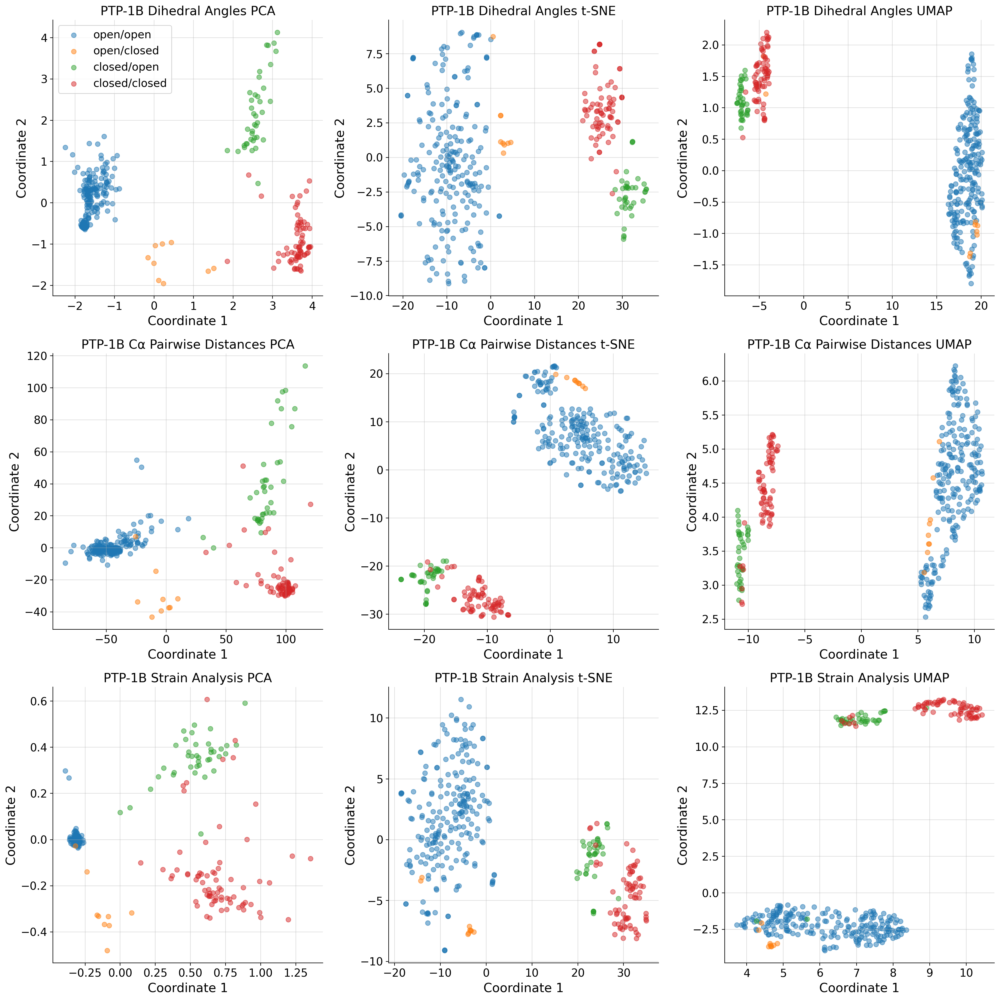

In [73]:
fig, ax = plt.subplots(3, 3, figsize=(18, 18), dpi=200)
ax = ax.flatten()
transform_list = [
    u_A,
    u_tsne_transform,
    u_umap_transform,
    pw_A,
    pw_tsne_transform,
    pw_umap_transform,
    sa_A,
    sa_tsne_transform,
    sa_umap_transform,
]
struc_list_list = [
    dihedral_strucs,
    dihedral_strucs,
    dihedral_strucs,
    pw_strucs,
    pw_strucs,
    pw_strucs,
    sa_strucs,
    sa_strucs,
    sa_strucs,
]
title_list = [
    "Dihedral Angles PCA",
    "Dihedral Angles t-SNE",
    "Dihedral Angles UMAP",
    "C\u03b1 Pairwise Distances PCA",
    "C\u03b1 Pairwise Distances t-SNE",
    "C\u03b1 Pairwise Distances UMAP",
    "Strain Analysis PCA",
    "Strain Analysis t-SNE",
    "Strain Analysis UMAP",
]

for i in np.arange(len(transform_list)):
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['right'].set_visible(False)
    ax[i].grid(alpha=0.4)
    # determine conformation color
    conformations = list()
    for k in struc_list_list[i]:
        if k.startswith("ptp1b_data/"):
            conformations.append(conformation_dict[k.split("/")[-1][8:-4]])
        else:
            conformations.append(conformation_dict[k])

    conformations = np.array(conformations)
    cluster1 = ax[i].scatter(
        transform_list[i][conformations == "open_open", 0],
        transform_list[i][conformations == "open_open", 1] if i != 3 else transform_list[i][conformations == "open_open", 2],
        marker="o",
        alpha=0.5,
        edgecolor=None,
        linewidth=1,
        label="open/open",
    )
    cluster2 = ax[i].scatter(
        transform_list[i][conformations == "open_closed", 0],
        transform_list[i][conformations == "open_closed", 1] if i != 3 else transform_list[i][conformations == "open_closed", 2],
        marker="o",
        alpha=0.5,
        edgecolor=None,
        linewidth=1,
        label="open/closed",
    )
    cluster3 = ax[i].scatter(
        transform_list[i][conformations == "closed_open", 0],
        transform_list[i][conformations == "closed_open", 1] if i != 3 else transform_list[i][conformations == "closed_open", 2],
        marker="o",
        alpha=0.5,
        edgecolor=None,
        linewidth=1,
        label="closed/open",
    )
    cluster4 = ax[i].scatter(
        transform_list[i][conformations == "closed_closed", 0],
        transform_list[i][conformations == "closed_closed", 1] if i != 3 else transform_list[i][conformations == "closed_closed", 2],
        marker="o",
        alpha=0.5,
        edgecolor=None,
        linewidth=1,
        label="closed/closed",
    )
    ax[i].set_ylabel("Coordinate 2")
    ax[i].set_xlabel("Coordinate 1")
    ax[i].set_title("PTP-1B " + title_list[i])
ax[0].legend(
    loc="upper left",
    handles=[cluster1, cluster2, cluster3, cluster4],
    labels=["open/open", "open/closed", "closed/open", "closed/closed"],
)
plt.tight_layout()
plt.show()

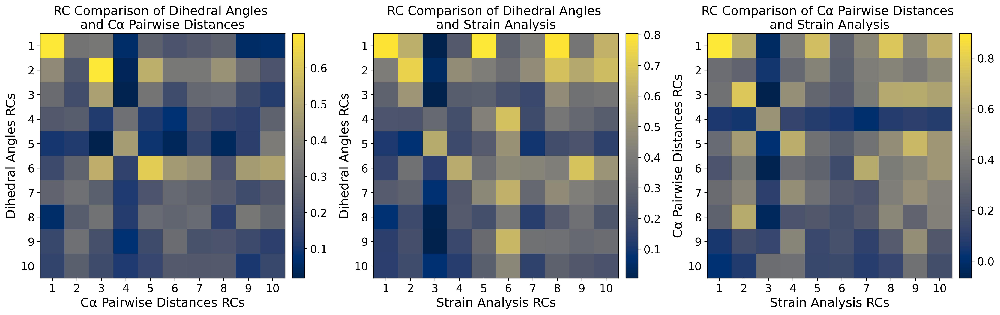

In [53]:
fig, ax = plt.subplots(1, 3, figsize=(18, 6), dpi=300)
ax = ax.flatten()
axs_list = [("Dihedral Angles", "C\u03b1 Pairwise Distances"), ("Dihedral Angles", "Strain Analysis"), ("C\u03b1 Pairwise Distances", "Strain Analysis")]
dot_matrix_list = [dh_pw_matrix, dh_sa_matrix, pw_sa_matrix]
for i in np.arange(3):
    im = ax[i].imshow(dot_matrix_list[i], cmap="cividis", interpolation=None)
    ax[i].set_xlabel(f"{axs_list[i][1]} RCs")
    ax[i].set_ylabel(f"{axs_list[i][0]} RCs")
    ax[i].set_title(f"RC Comparison of {axs_list[i][0]} \nand {axs_list[i][1]}")
    ax[i].set_xticks(np.arange(10), labels=np.arange(1,11))
    ax[i].set_yticks(np.arange(10), labels=np.arange(1,11))
    divider = make_axes_locatable(ax[i])
    cax = divider.append_axes("right", "5%", pad="3%")
    plt.colorbar(im, cax=cax)
plt.tight_layout()
plt.show()

In [54]:
dh_sa_matrix[0,0], dh_sa_matrix[1,1]

(0.7930733134139794, 0.7402361991988899)

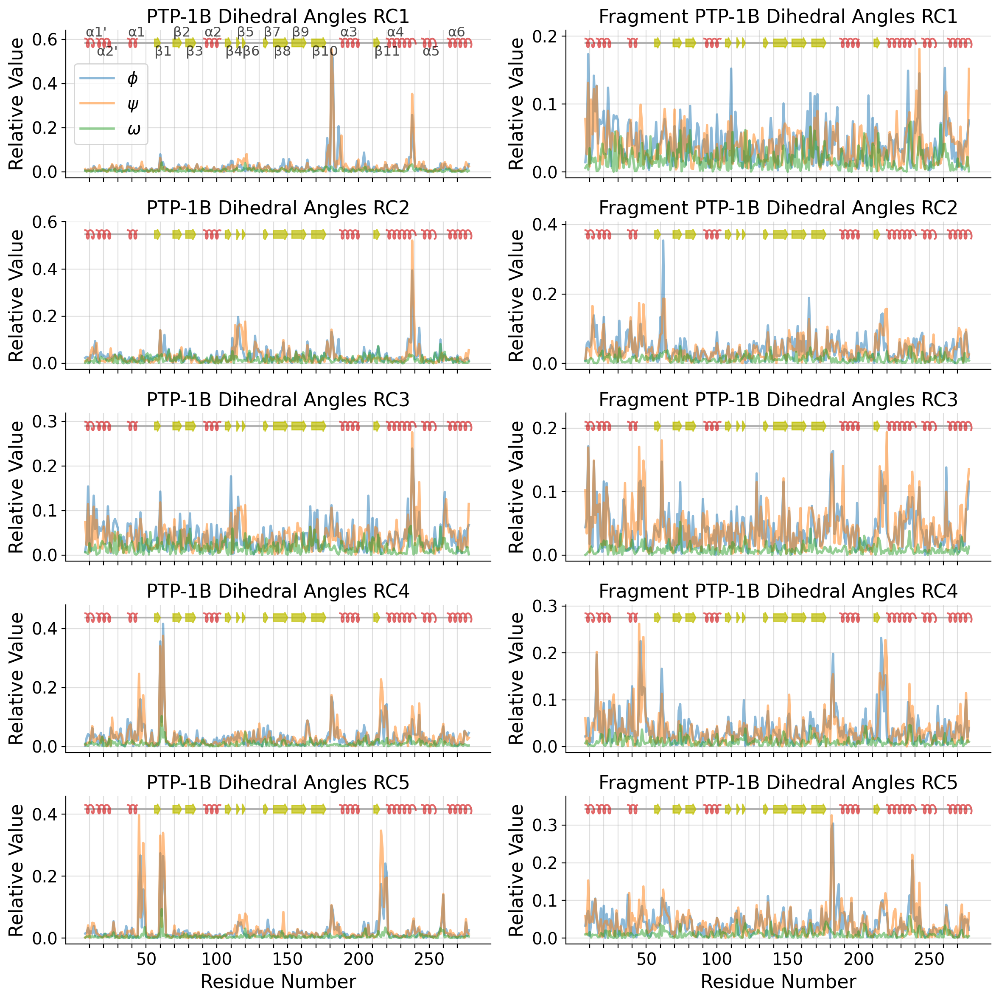

In [55]:
# dihedral angle transformed loadings
r = 10
r_list = [r - 1, r - 2]
fig, ax = plt.subplots(r // 2, 2, figsize=(12, 12), dpi=200)
ax = ax.flatten()
psi_idx = np.arange(0, untreated_dihedrals_data.shape[1] // 2, 3)
omg_idx = np.arange(1, untreated_dihedrals_data.shape[1] // 2, 3)
phi_idx = np.arange(2, untreated_dihedrals_data.shape[1] // 2, 3)
dh_range = np.arange(resnum_bounds[0], resnum_bounds[1])
for i in np.arange(r):
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['right'].set_visible(False)
    ax[i].grid(alpha=0.4)
    if i % 2 == 0: 
        (phi_trace,) = ax[i].plot(
            dh_range,
            calculate_dh_rc(u_pca.components_[i//2])[phi_idx],
            "-",
            label=r"$\phi$",
            linewidth=2,
            alpha=0.5,
        )
        (psi_trace,) = ax[i].plot(
            dh_range,
            calculate_dh_rc(u_pca.components_[i//2])[psi_idx],
            "-",
            label=r"$\psi$",
            linewidth=2,
            alpha=0.5,
        )
        (omg_trace,) = ax[i].plot(
            dh_range,
            calculate_dh_rc(u_pca.components_[i//2])[omg_idx],
            "-",
            label=r"$\omega$",
            linewidth=2,
            alpha=0.5,
        )
        ylims = ax[i].get_ylim()
        ax[i].set_title(f"PTP-1B Dihedral Angles RC{i//2+1}")
        ax[i].set_xticks(
            [dh for dh in dh_range if dh % 10 == 0],
            labels=[dh if dh % 50 == 0 else '' for dh in dh_range if dh % 10 == 0],
        )
        ax[i].set_ylabel("Relative Value")
        if i not in r_list:
            ax[i].set_xticklabels([])
        ax[i].plot(np.arange(7,280), [ylims[1]]*273, alpha=0.3, color='k', linestyle='-', zorder=1)
        ax[i].set_ylim((ylims[0], ylims[1]*1.1))
        counter = 0
        for k,v in ptp1b_ss_dict.items(): 
            if k.startswith(u'\u03b1'): 
                ts = np.linspace(v[0], v[1], num=1000)
                ax[i].plot(ts + 1.5*np.sin((ts-v[0])*2*np.pi/3.6), (ylims[1]/30)*np.cos((ts-v[0])*2*np.pi/3.6)+ylims[1], color='tab:red', alpha=0.7, zorder=2)
                if i == 0: 
                    ax[i].text(v[0], ylims[1]+(1.5*ylims[1]/30) if counter%2 == 0 else ylims[1]-(3*ylims[1]/30), k, fontsize='small', alpha=0.7)
                    counter += 1
            else: 
                ax[i].arrow(v[0],ylims[1],v[1]-v[0]+1,0, width=(ylims[1]/17), head_width=(ylims[1]/12), head_length=2, ec='y', fc='y', length_includes_head=True, alpha=0.7, zorder=3)
                if i == 0: 
                    ax[i].text(v[0], ylims[1]+(1.5*ylims[1]/30) if counter%2 == 0 else ylims[1]-(3*ylims[1]/30), k, fontsize='small', alpha=0.7)
                    counter += 1
    else:  
        (phi_trace,) = ax[i].plot(
            dh_range,
            calculate_dh_rc(fragment_pca.components_[i//2])[phi_idx],
            "-",
            label=r"$\phi$",
            linewidth=2,
            alpha=0.5,
        )
        (psi_trace,) = ax[i].plot(
            dh_range,
            calculate_dh_rc(fragment_pca.components_[i//2])[psi_idx],
            "-",
            label=r"$\psi$",
            linewidth=2,
            alpha=0.5,
        )
        (omg_trace,) = ax[i].plot(
            dh_range,
            calculate_dh_rc(fragment_pca.components_[i//2])[omg_idx],
            "-",
            label=r"$\omega$",
            linewidth=2,
            alpha=0.5,
        )
        ylims = ax[i].get_ylim()
        ax[i].set_title(f"Fragment PTP-1B Dihedral Angles RC{i//2+1}")
        ax[i].set_xticks(
            [dh for dh in dh_range if dh % 10 == 0],
            labels=[dh if dh % 50 == 0 else '' for dh in dh_range if dh % 10 == 0],
        )
        ax[i].set_ylabel("Relative Value")
        if i not in r_list:
            ax[i].set_xticklabels([])
        ax[i].plot(np.arange(7,280), [ylims[1]]*273, alpha=0.3, color='k', linestyle='-', zorder=1)
        ax[i].set_ylim((ylims[0], ylims[1]*1.1))
        counter = 0
        for k,v in ptp1b_ss_dict.items(): 
            if k.startswith(u'\u03b1'): 
                ts = np.linspace(v[0], v[1], num=1000)
                ax[i].plot(ts + 1.5*np.sin((ts-v[0])*2*np.pi/3.6), (ylims[1]/30)*np.cos((ts-v[0])*2*np.pi/3.6)+ylims[1], color='tab:red', alpha=0.7, zorder=2)
                if i == 0: 
                    ax[i].text(v[0], ylims[1]+0.14 if counter%2 == 0 else ylims[1]+0.03, k, fontsize='small')
                    counter += 1
            else: 
                ax[i].arrow(v[0],ylims[1],v[1]-v[0]+1,0, width=(ylims[1]/17), head_width=(ylims[1]/12), head_length=2, ec='y', fc='y', length_includes_head=True, alpha=0.7, zorder=3)
                if i == 0: 
                    ax[i].text(v[0], ylims[1]+0.14 if counter%2 == 0 else ylims[1]+0.03, k, fontsize='small')
                    counter += 1
ax[0].legend(loc="center left")
ax[-1].set_xlabel("Residue Number")
ax[-2].set_xlabel("Residue Number")
plt.tight_layout()
plt.show()

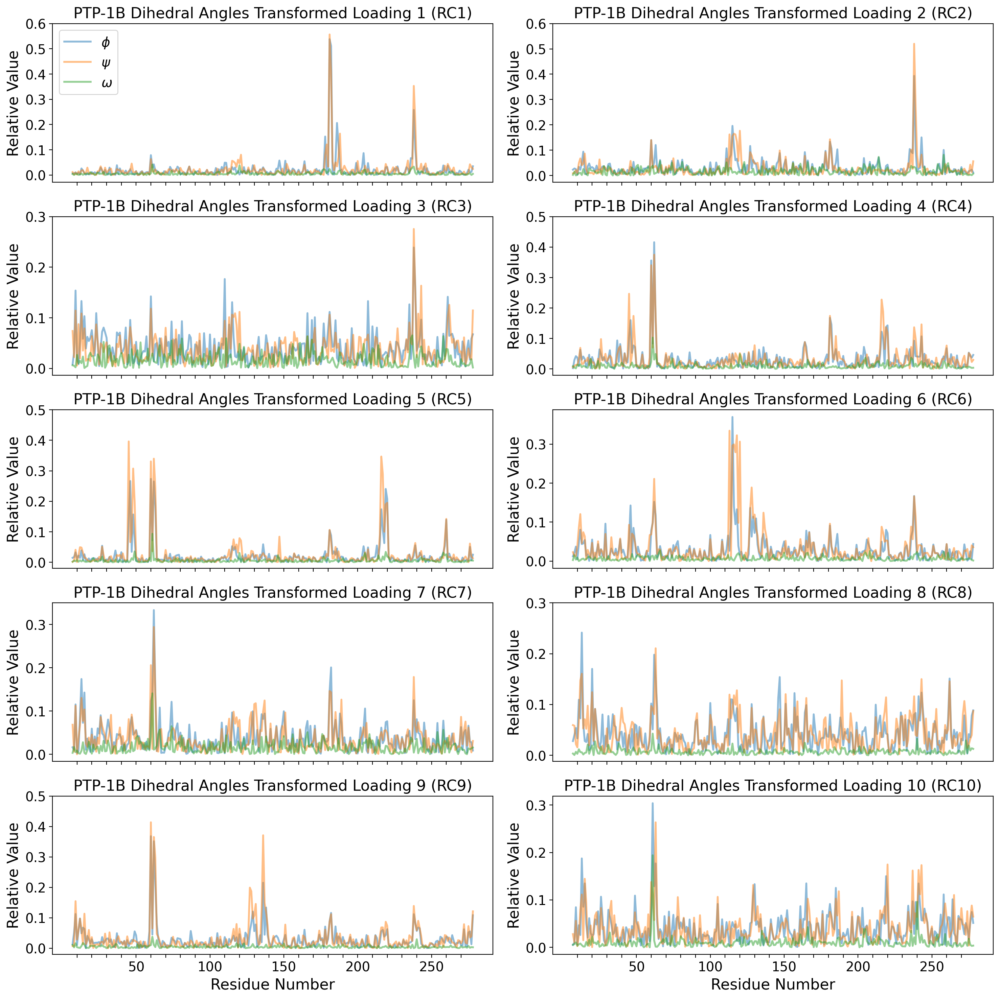

In [56]:
# dihedral angle transformed loadings
r = 10
r_list = [r - 1, r - 2]
fig, ax = plt.subplots(r // 2, 2, figsize=(15, 15), dpi=200)
ax = ax.flatten()
psi_idx = np.arange(0, untreated_dihedrals_data.shape[1] // 2, 3)
omg_idx = np.arange(1, untreated_dihedrals_data.shape[1] // 2, 3)
phi_idx = np.arange(2, untreated_dihedrals_data.shape[1] // 2, 3)
dh_range = np.arange(resnum_bounds[0], resnum_bounds[1])
for k in np.arange(r):
    (phi_trace,) = ax[k].plot(
        dh_range,
        calculate_dh_rc(u_pca.components_[k])[phi_idx],
        "-",
        label=r"$\phi$",
        linewidth=2,
        alpha=0.5,
    )
    (psi_trace,) = ax[k].plot(
        dh_range,
        calculate_dh_rc(u_pca.components_[k])[psi_idx],
        "-",
        label=r"$\psi$",
        linewidth=2,
        alpha=0.5,
    )
    (omg_trace,) = ax[k].plot(
        dh_range,
        calculate_dh_rc(u_pca.components_[k])[omg_idx],
        "-",
        label=r"$\omega$",
        linewidth=2,
        alpha=0.5,
    )

    ax[k].set_title(f"PTP-1B Dihedral Angles Residue Contribution {k+1} (RC{k+1})")
    ax[k].set_xticks(
        [dh for dh in dh_range if dh % 10 == 0],
        labels=[dh if dh % 50 == 0 else '' for dh in dh_range if dh % 10 == 0],
    )
    ax[k].set_yticks(
        np.arange(0, ax[k].get_yticks().max(), 0.1),
        labels=np.round(np.arange(0, ax[k].get_yticks().max(), 0.1), 2),
    )
    ax[k].set_ylabel("Relative Value")
    if k not in r_list:
        ax[k].set_xticklabels([])
ax[0].legend(loc="upper left")
ax[-1].set_xlabel("Residue Number")
ax[-2].set_xlabel("Residue Number")
plt.tight_layout()
plt.show()

ptp1b_data/ptp1b_theseus_data/theseus_6bai_chainA.pdb
ptp1b_data/ptp1b_theseus_data/theseus_1g1h_chainA.pdb


Text(0, 0.5, 'Counts')

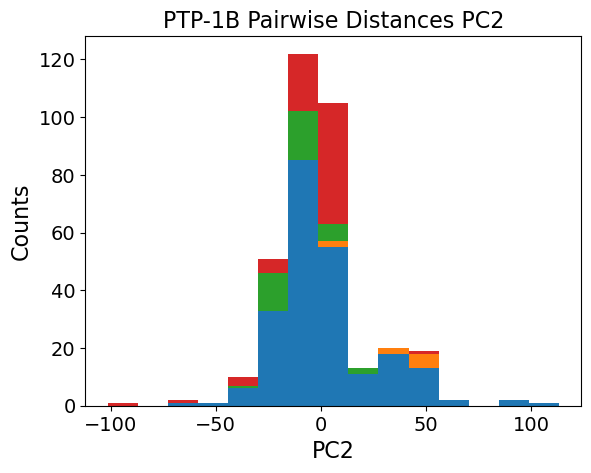

In [57]:
conformations = list()
for k in pw_strucs:
    if k.startswith("ptp1b_data/"):
        conformations.append(conformation_dict[k.split("/")[-1][8:-4]])
    else:
        conformations.append(conformation_dict[k])
conformations = np.array(conformations)
print(pw_strucs[np.argmax(pw_A[:,1])])
print(pw_strucs[np.argmin(pw_A[:,1])])
pc_num = 1
plt.hist(np.array([pw_A[conformations=='open_open',pc_num], 
          pw_A[conformations=='open_closed',pc_num], 
          pw_A[conformations=='closed_open',pc_num], 
          pw_A[conformations=='closed_closed',pc_num]], dtype='object'), 
bins=15, density=False, histtype='bar', stacked=True, label=['open/open', 'open/closed', 'closed/open', 'closed/closed'])
plt.title(f'PTP-1B Pairwise Distances PC{pc_num+1}')
plt.xlabel(f'PC{pc_num+1}')
plt.ylabel('Counts')

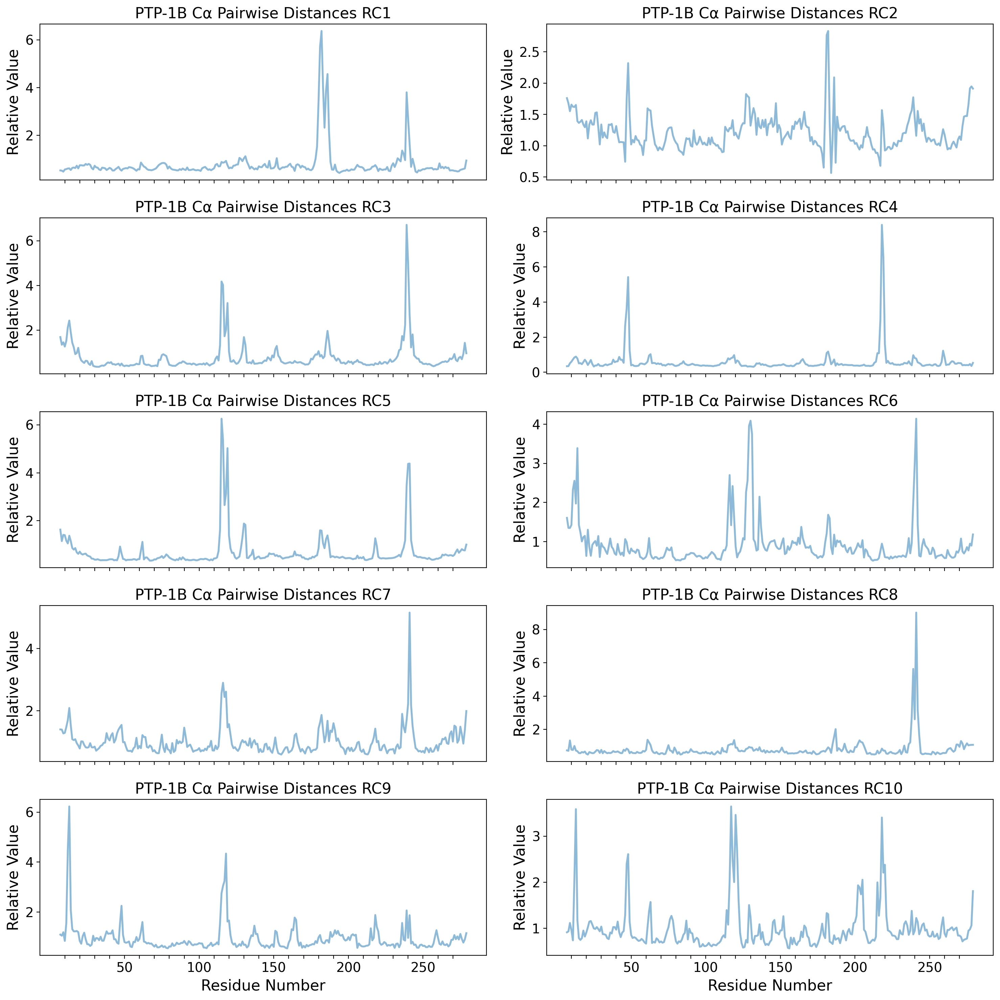

In [58]:
# pairwise distances tranformed loadings
r = 10
r_list = [r - 1, r - 2]
fig, ax = plt.subplots(r // 2, 2, figsize=(15, 15), dpi=200)
ax = ax.flatten()

for k in np.arange(r):
    ax[k].plot(
        np.arange(resnum_bounds[0], resnum_bounds[1] + 1),
        calculate_pw_rc(pw_pca.components_[k], resnum_bounds),
        "-",
        linewidth=2,
        alpha=0.5,
    )
    ax[k].set_title(f"PTP-1B C\u03b1 Pairwise Distances RC{k+1}")
    ax[k].set_xticks(
        [x for x in np.arange(resnum_bounds[0], resnum_bounds[1] + 1) if x % 10 == 0],
        labels=[
            x if x % 50 == 0 else '' for x in np.arange(resnum_bounds[0], resnum_bounds[1]) if x % 10 == 0
        ],
    )

    ax[k].set_ylabel("Relative Value")
    if k not in r_list:
        ax[k].set_xticklabels([])
ax[-1].set_xlabel("Residue Number")
ax[-2].set_xlabel("Residue Number")
plt.tight_layout()
plt.show()

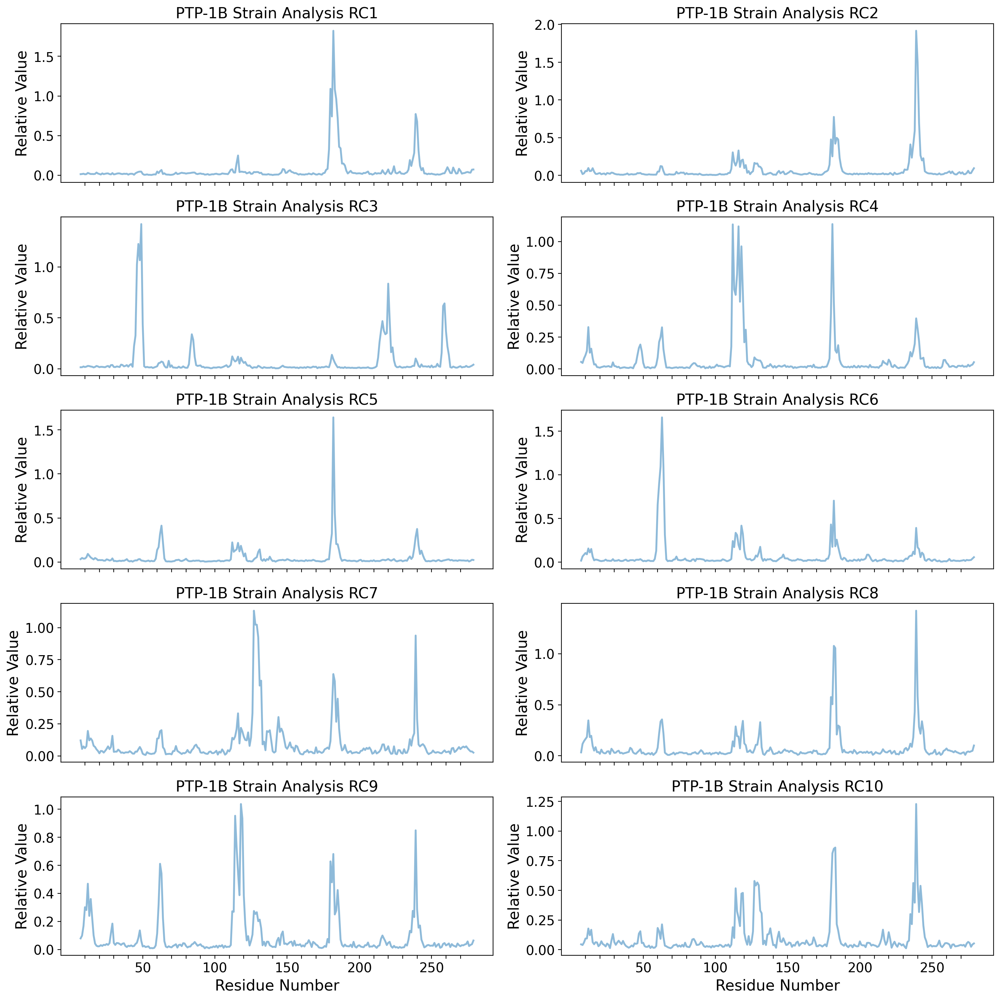

In [59]:
# strain analysis tranformed loadings
r = 10
r_list = [r - 1, r - 2]
fig, ax = plt.subplots(r // 2, 2, figsize=(15, 15), dpi=200)
ax = ax.flatten()
shared_atom_set = pickle.load(open("ptp1b_data/ptp1b_atom_set.pkl", "rb"))

for k in np.arange(r):
    ax[k].plot(
        np.arange(resnum_bounds[0], resnum_bounds[1] + 1),
        calculate_sa_rc(sa_pca.components_[k], sorted(shared_atom_set)),
        "-",
        linewidth=2,
        alpha=0.5,
    )
    ax[k].set_title(f"PTP-1B Strain Analysis RC{k+1}")
    ax[k].set_xticks(
        [x for x in np.arange(resnum_bounds[0], resnum_bounds[1] + 1) if x % 10 == 0],
        labels=[
            x if x % 50 == 0 else '' for x in np.arange(resnum_bounds[0], resnum_bounds[1]) if x % 10 == 0
        ],
    )

    ax[k].set_ylabel("Relative Value")
    if k not in r_list:
        ax[k].set_xticklabels([])
ax[-1].set_xlabel("Residue Number")
ax[-2].set_xlabel("Residue Number")
plt.tight_layout()
plt.show()